# immgenT-CD8 dataset — analysis notebook


This notebook documents data processing, annotation, and figure generation for the immgenT-CD8 T-cell CITE-seq atlas.

**CITE-seq** (cellular indexing of transcriptomes and epitopes by sequencing) jointly profiles transcriptome-wide gene expression and surface protein (ADT) abundance in single cells ([Stoeckius et al., 2017](https://www.nature.com/articles/nmeth.4380)).

**Dataset:** immgenT-CD8 T cells (multi-organ, multi-condition CITE-seq).

**Notebook structure (paper figure numbering):**
- **Figure 1** — immgenT resolves CD8+ T cell heterogeneity into 21 discrete clusters and a reference
embedding.
- **Figure 2** — Shared CD8+ T cell states across immune conditions.
- **Figure 3** — Effector CD8+ T cells comprise three distinct recurrent states.
- **Figure 4** — Circulating memory CD8+ T cells map to three main clusters that are present broadly beyond
acute infections.
- **Figure 5** — Tissue-resident memory CD8+ T cells converge on a single dominant transcriptional state while
maintaining tissue-specific differences.
- **Figure 6** — Exhaustion and residency-associated states form a continuum.
- **Extended Data Figure 1** — Comprehensive integration of the CD8αβ immgenT framework.
- **Extended Data Figure 2** — Acute effector states (clusters CD8.I, .J, and .K).
- **Extended Data Figure 3** — Phenotypic and transcriptional signatures of circulating memory states
(clusters CD8.E, .F, .G, and .H).
- **Extended Data Figure 4** — Surface-marker and transcriptional heterogeneity of tissue-resident memory
CD8+ T cells in cluster CD8.Q.
- **Extended Data Figure 5** — Detailed mapping of the exhaustion/residency continuum and
progenitor-exhausted cells.
- **Extended Data Figure 7** — immgenT-CD8 flow cytometry panel and validation.
- **Extended Data Table 2** — Summary of endogenous and antigen-specific cell counts across samples, conditions and tissues (only samples with at least 10 total CD8+ T cells recovered in at least one cluster are shown).

For figures and tables not covered by this notebook, including T-RBI analyses, refer to immgenT-Cosmology (Magill et al., bioRxiv 2026).

Paths and intermediate filenames reflect the analysis environment used to generate the paper figures; adjust them as needed when re-running.

# How to use this object

This MuData contains the curated immgenT-CD8 CITE-seq dataset with sparse raw counts, full metadata, and the main embedding (MDE_INCREMENTAL).

After loading the object, a typical workflow is:

- Start from the raw counts (layers["counts"] or .X)
- Normalize, log-transform and scale the modalities (sc.pp.normalize_total → sc.pp.log1p → sc.pp.scale)
- Optionally apply CLR normalization to the ADT modality (muon.prot.pp.clr)
- Use the pre-computed embedding available in obsm["MDE_INCREMENTAL"] for visualization and downstream analysis

All key metadata columns are already present in both modalities.
- Ag_spe_v1: prioritize CITE-Seq congenic markers for annotation of P14 CD8+ T cells
- Ag_spe_v2: prioritize TCR-Seq for annotation of P14 CD8+ T cells

# Libraries and environment


Import required libraries and configure plotting defaults.


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import gseapy as gp
import matplotlib.pyplot as plt
import scanpy as sc
import muon as mu
from muon import prot as pt
import random

random.seed(0)
np.random.seed(0)
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
sc.set_figure_params(frameon=True, figsize=(4, 4), dpi_save=300, transparent=True, format='eps',)
%config InlineBackend.print_figure_kwargs={'facecolor' : "w"}
%config InlineBackend.figure_format='retina'


Create color dictionary.


In [76]:

custom_colors = {
    'CD8.A': '#00008B',      # blue2 (darkblue)
    'CD8.B': '#FF7F00',      # darkorange2
    'CD8.C': '#EE0000',      # red2
    'CD8.D': '#556B2F',      # darkolivegreen
    'CD8.E': '#6B8E23',      # darkolivegreen2 (olive drab)
    'CD8.F': '#9400D3',      # darkorchid2
    'CD8.G': '#CD3333',      # brown2
    'CD8.H': '#7AC5CD',      # cadetblue2
    'CD8.I': '#9BCD9B',      # darkseagreen2
    'CD8.J': '#D02090',      # violetred2
    'CD8.K': '#9932CC',      # darkorchid
    'CD8.P': '#000000',      # black
    'CD8.Q': '#76EE00',      # chartreuse2
    'CD8.R': '#FF69B4',      # pink2 (hotpink)
    'CD8.S': '#CD950C',      # darkgoldenrod2
    'CD8.T': '#FF8C00',      # darkorange
    'CD8.wM': '#808080',     # grey
    'CD8.wU': '#00EEEE',     # cyan2
    'CD8.wV': '#0000FF',     # blue
    'CD8.wX': '#EEC591',     # burlywood2
    'CD8.wY': '#00B7EB'      # deepskyblue2
}

Setup object.

In [3]:
# ------------------------------------------------------------
# Load the public object
# ------------------------------------------------------------
mdata = mu.read_h5mu("data/immgenT-CD8.h5mu")  # ← update path if needed
rna = mdata["RNA"]
adt = mdata["ADT"]
print(mdata)

# ------------------------------------------------------------
# Standard normalization + scaling (RNA)
# ------------------------------------------------------------
# Keep raw counts in a layer
rna.layers["counts"] = rna.X.copy()

# Normalize → log1p
sc.pp.normalize_total(rna, target_sum=1e4)
sc.pp.log1p(rna)
rna.layers["log_norm"] = rna.X.copy()

# Scale
sc.pp.scale(rna, max_value=10)
rna.layers["scaled"] = rna.X.copy()

# ------------------------------------------------------------
# Standard normalization + scaling (ADT)
# ------------------------------------------------------------
adt.layers["counts"] = adt.X.copy()

# Option A: total-count normalization + log1p
sc.pp.normalize_total(adt, target_sum=1e4)
sc.pp.log1p(adt)
adt.layers["log_norm"] = adt.X.copy()

# Reset again to raw counts
adt.X = adt.layers["counts"].copy()

# Option B: Centered Log-Ratio (CLR) – often better for protein data
from muon import prot as pt
pt.pp.clr(adt)
adt.layers["clr"] = adt.X.copy()

# Scale (applied on the current .X, which is CLR at this point)
sc.pp.scale(adt, max_value=10)
adt.layers["scaled"] = adt.X.copy()

print("\nPreprocessing done.")
print(mdata)

MuData object with n_obs × n_vars = 206160 × 55674
  2 modalities
    RNA:	206160 x 55494
      obs:	'Ag_spe_v1', 'Ag_spe_v2', 'G2M.Score', 'HT', 'IGT', 'IGTHT', 'IGT_cellID', 'MAIT', 'S.Score', 'age_weeks', 'cite_seq', 'cluster_annotation', 'comments', 'condition_broad', 'condition_detailed', 'condition_detailed_organ', 'condition_detailed_simplified', 'exp_id', 'exp_name', 'exp_number', 'gating_strategy', 'genetics', 'ht_number', 'iNKT', 'ident', 'igt_number', 'infection_agent', 'infection_dose', 'infection_mode', 'jax', 'lab', 'nCount_ADT', 'nCount_RNA', 'nFeature_ADT', 'nFeature_RNA', 'organ', 'organ_simplified', 'organ_uberon_id', 'organism_name', 'pool_of_mice', 'prep_description', 'sample_code', 'sample_name', 'sample_type', 'sex', 'strain', 'target_cells', 'target_cells_simplified', 'timepoint', 'transgenic_byTCR', 'transgenic_tet_byCITEseq', 'transgenic_tet_bySorting', 'treat_agent', 'treat_dose', 'tumor'
      uns:	'X_name'
      obsm:	'MDE_INCREMENTAL'
      layers:	'counts'

# Fig. 1

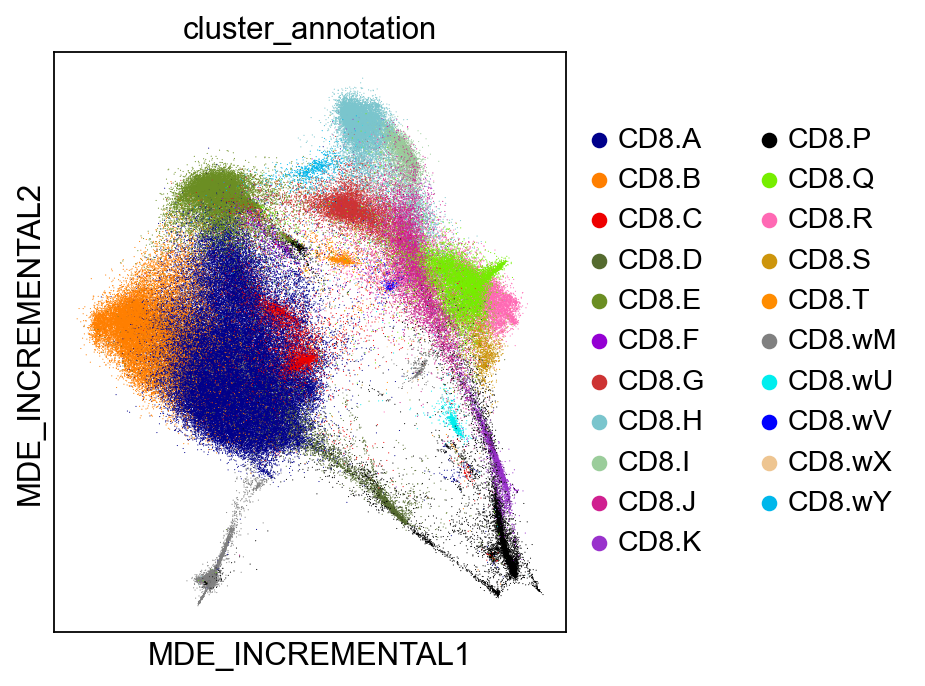

Plot saved: Fig_1d.pdf


In [4]:
# Fig. 1d — global MDE
with plt.rc_context():
    fig, ax = plt.subplots(figsize=(6, 4.5))
    mu.pl.embedding(
        mdata['RNA'],
        basis="MDE_INCREMENTAL",
        color="cluster_annotation",
        palette=custom_colors,
        legend_loc="right margin",
        ax=ax,
        size=1,
        show=False,
    )
    plt.tight_layout(w_pad=0.55)
    plt.savefig("Fig_1d.pdf", bbox_inches="tight")
    plt.show()
    plt.close()
    print("Plot saved: Fig_1d.pdf")

Removed 22 rows belonging to unwanted conditions: ['KbDbKO', 'KbDbQa1KO', 'NP_OVA', 'KbDbQa1KO_MCMV']
Data loaded, standardized, and filtered.
Canonical order defined: 49 unique detailed conditions

Kept 558 / 666 samples (83.8%) based on min_cells_per_sample >= 10

=== SAMPLES PER CONDITION (after cell count filtering) ===
                               total_samples  selected_samples  removed_samples  kept_pct
condition_detailed_simplified                                                            
GBMpron                                    1                 0                1       0.0
MHCIIhet_Ea16                              4                 0                4       0.0
MHCIIhet                                   6                 0                6       0.0
MHCIIKO_Ea16                               6                 0                6       0.0
MHCIIKO                                    2                 0                2       0.0
PDAC_FishHFD                               1

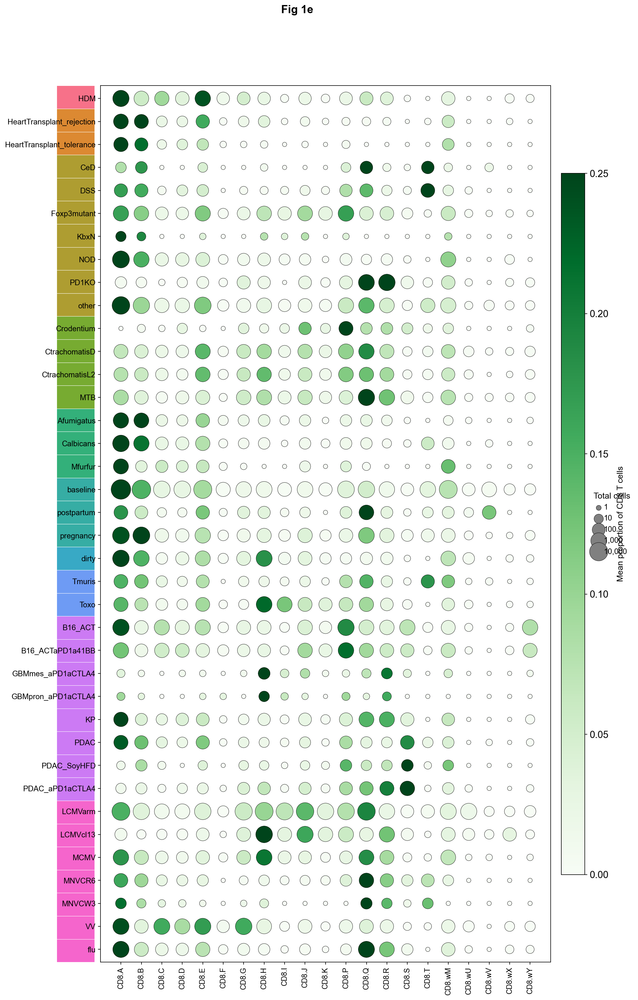

In [5]:
# Fig. 1e — atlas balloon plot (cluster proportions by sample)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from matplotlib.gridspec import GridSpec

# ==============================================
# Vector-export font settings (Illustrator-compatible)
# ==============================================
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Arial', 'Helvetica', 'DejaVu Sans']

# ==============================================
# 1. Load and clean sample-level proportion table
# ==============================================
file_path = "data/immgenT-CD8.xlsx"
m3_full = pd.read_excel(file_path)

# Label standardization
m3_full['target_cells'] = m3_full['target_cells'].astype(str).str.strip()
m3_full['target_cells'] = m3_full['target_cells'].replace(['all T', 'allT', 'All T'], 'all CD8', regex=True)
m3_full['condition_broad'] = m3_full['condition_broad'].str.replace('cancer', 'tumor', regex=False, case=False)
m3_full['condition_broad'] = m3_full['condition_broad'].str.replace('autoimmune', 'autoimmunity', regex=False, case=False)

def add_cd8_prefix(label):
    if pd.isna(label):
        return label
    s = str(label).strip()
    if s.startswith('CD8') or s == 'all CD8':
        return s
    if s.endswith(' T') or s.endswith('T'):
        return f"CD8 {s.rstrip(' T').rstrip('T').strip()}"
    return s

m3_full['target_cells'] = m3_full['target_cells'].apply(add_cd8_prefix)
m3_full['target_cells'] = m3_full['target_cells'].str.replace('splenocytes', 'CD45+', regex=False)
m3_full['target_cells'] = m3_full['target_cells'].str.replace('CD8\+', 'CD8', regex=True)
m3_full['target_cells'] = m3_full['target_cells'].str.replace('CD8 T', 'CD8', regex=True)
m3_full['target_cells'] = m3_full['target_cells'].str.replace('OT1', 'OT-I', regex=True)
m3_full['target_cells'] = m3_full['target_cells'].str.replace('all CD8', 'CD8', regex=False)
m3_full['target_cells'] = m3_full['target_cells'].str.replace('CD44+ T', 'CD44+', regex=False)

special_markers = ['CD44+', 'VP1', 'PLZF+', 'Ly49', 'NK1.1', 'KLRG1+', 'CD69+', 'CD103+',
                   'CD62L-', 'CD27-', 'CD127-', 'Tbet+', 'Eomes+', 'Blimp1+', 'Granzyme+',
                   'iNKT', 'MAIT', 'NKT', 'γδ', 'Vd6b', 'Vg4', 'Vg6', 'Vg7']

pattern = r'CD8\s+(?=' + '|'.join([f'.*{m}' for m in special_markers]) + r')'
m3_full['target_cells'] = m3_full['target_cells'].str.replace(pattern, '', regex=True)

for m in special_markers:
    m3_full['target_cells'] = m3_full['target_cells'].str.replace(rf'CD8\s+{m}(\s|$)', m + ' ', regex=True)

# === Remove unwanted conditions from y-axis ===
unwanted_conditions = ['KbDbKO', 'KbDbQa1KO', 'NP_OVA', 'KbDbQa1KO_MCMV']
mask = m3_full['condition_detailed_simplified'].isin(unwanted_conditions)
n_removed = mask.sum()
m3_full = m3_full[~mask].copy()
print(f"Removed {n_removed} rows belonging to unwanted conditions: {unwanted_conditions}")

print("Data loaded, standardized, and filtered.")

# Canonical order
order_df = (m3_full[['condition_broad', 'condition_detailed_simplified']]
            .drop_duplicates()
            .sort_values(['condition_broad', 'condition_detailed_simplified'])
            .reset_index(drop=True))

CANONICAL_CONDITION_ORDER = order_df['condition_detailed_simplified'].unique().tolist()
print(f"Canonical order defined: {len(CANONICAL_CONDITION_ORDER)} unique detailed conditions")

# Color maps
unique_broad = sorted(order_df['condition_broad'].dropna().unique())
broad_palette = sns.color_palette("husl", len(unique_broad))
broad_color_map = dict(zip(unique_broad, broad_palette))
cmap_all = sns.color_palette("Greens", as_cmap=True)

# ==============================================
# DOTPLOT FUNCTION
# ==============================================
def make_comp_dotplot_level2_only(
    data,
    condition_col="condition_detailed_simplified",
    cmap=None,
    vmin=0,
    vmax=0.25,
    colorbar_ticks=[0, 0.05, 0.10, 0.15, 0.20, 0.25],
    figsize=(18, 22),
    outfile=None,
    exclude_clusters=None,
    min_cells_per_sample=10,
):
    if cmap is None:
        cmap = sns.color_palette("Greens", as_cmap=True)
    if exclude_clusters is None:
        exclude_clusters = []

    value_cols = [c for c in data.columns if c.endswith(('.prop', '.ncells'))]
    if not value_cols:
        print("No Level-2 columns found!")
        return pd.DataFrame()

    # Melt
    long = pd.melt(data, id_vars=[condition_col, 'sample_code'],
                   value_vars=value_cols, var_name='col', value_name='value')
    long[['cluster', 'metric']] = long['col'].str.rsplit('.', n=1, expand=True)
    long = long[~long['cluster'].isin(exclude_clusters)]

    # Sample quality filtering
    wide = long.pivot_table(index=[condition_col, 'sample_code', 'cluster'],
                            columns='metric', values='value', aggfunc='first').reset_index()
    
    sample_quality = wide.groupby(['sample_code', condition_col])['ncells'].max().reset_index()
    sample_quality['keep_sample'] = sample_quality['ncells'] >= min_cells_per_sample
    selected_samples = sample_quality[sample_quality['keep_sample']].copy()
    
    print(f"\nKept {len(selected_samples)} / {len(sample_quality)} samples "
          f"({len(selected_samples)/len(sample_quality)*100:.1f}%) based on min_cells_per_sample >= {min_cells_per_sample}")

    # Summary per condition
    total_per_cond = sample_quality.groupby(condition_col).size()
    selected_per_cond = selected_samples.groupby(condition_col).size()
    summary = pd.DataFrame({'total_samples': total_per_cond})
    summary['selected_samples'] = selected_per_cond
    summary['removed_samples'] = summary['total_samples'] - summary['selected_samples'].fillna(0)
    summary['kept_pct'] = (summary['selected_samples'].fillna(0) / summary['total_samples'] * 100).round(1)
    summary = summary.fillna({'selected_samples': 0, 'removed_samples': 0}).astype({
        'selected_samples': int, 'removed_samples': int
    })
    
    print("\n=== SAMPLES PER CONDITION (after cell count filtering) ===")
    print(summary.sort_values('kept_pct').to_string())

    # === Save selected samples list (NEW) ===
    if outfile:
        selected_samples_df = selected_samples.copy()
        broad_map = order_df.set_index('condition_detailed_simplified')['condition_broad'].to_dict()
        selected_samples_df['condition_broad'] = selected_samples_df[condition_col].map(broad_map)
        
        csv_path = outfile.replace('.pdf', '_selected_samples.csv')
        selected_samples_df = selected_samples_df[[condition_col, 'condition_broad', 'sample_code', 'ncells']]
        selected_samples_df = selected_samples_df.sort_values([condition_col, 'sample_code'])
        selected_samples_df.to_csv(csv_path, index=False)
        print(f"\nSaved selected samples list → {csv_path} ({len(selected_samples_df)} samples)")

    # Filter + aggregate
    wide_filtered = wide[wide['sample_code'].isin(selected_samples['sample_code'])].copy()

    agg = wide_filtered.groupby([condition_col, 'cluster']).agg(
        mean_prop=('prop', 'mean'),
        total_ncells=('ncells', 'sum'),
        n_samples=('sample_code', 'nunique')
    ).reset_index()

    valid_conditions = [c for c in CANONICAL_CONDITION_ORDER if c in agg[condition_col].values]
    agg = agg[agg[condition_col].isin(valid_conditions)].copy()
    agg[condition_col] = pd.Categorical(agg[condition_col], categories=valid_conditions, ordered=True)

    # Plotting
    cluster_order = []
    seen = set()
    for col in data.columns:
        if col.endswith('.prop'):
            cl = col.rsplit('.', 1)[0]
            if cl not in seen and cl not in exclude_clusters:
                cluster_order.append(cl)
                seen.add(cl)
    cluster_order = sorted(cluster_order)

    agg['cluster'] = pd.Categorical(agg['cluster'], categories=cluster_order, ordered=True)
    agg = agg.sort_values([condition_col, 'cluster']).copy()

    row_colors_filtered = [
        broad_color_map[order_df[order_df['condition_detailed_simplified'] == cond]['condition_broad'].iloc[0]]
        for cond in valid_conditions
    ]

    agg['size_log10'] = np.log10(agg['total_ncells'] + 1)

    fig = plt.figure(figsize=figsize)
    gs = GridSpec(1, 2, width_ratios=[0.07, 1], wspace=0.02)
    ax_cb = fig.add_subplot(gs[0])
    ax_cb.set_ylim(0, len(valid_conditions))
    ax_cb.invert_yaxis()
    ax_cb.axis('off')
    for i, color in enumerate(row_colors_filtered):
        ax_cb.add_patch(plt.Rectangle((0, i), 1, 1, facecolor=color, edgecolor='white', linewidth=0.5))

    ax = fig.add_subplot(gs[1])
    sns.scatterplot(data=agg, x='cluster', y=condition_col, size='size_log10',
                    sizes=(40, 800), hue='mean_prop', palette=cmap, hue_norm=(vmin, vmax),
                    edgecolor='black', linewidth=0.4, ax=ax, legend=False)

    ax.margins(y=0.015)
    plt.xticks(rotation=90, ha='center', fontsize=10.5)
    plt.yticks(fontsize=11)
    plt.xlabel(None)
    plt.ylabel(None)
    ax.grid(False)

    if outfile:
        title = os.path.basename(outfile).replace('.pdf', '').replace('_', ' ')
        plt.suptitle(title, fontsize=16, fontweight='bold', y=0.98)

    norm = plt.Normalize(vmin, vmax)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=ax, shrink=0.8, aspect=30, pad=0.02)
    cbar.set_label('Mean proportion of CD8 T cells', fontsize=12, labelpad=12)
    cbar.set_ticks(colorbar_ticks)
    cbar.set_ticklabels([f"{t:.2f}" for t in colorbar_ticks])

    max_cells_val = agg['total_ncells'].max()
    handles, labels = [], []
    for size in [1, 10, 100, 1_000, 10_000, 50_000]:
        if size <= max_cells_val:
            s_scaled = np.log10(size + 1) * 800 / np.log10(max_cells_val + 1)
            handles.append(plt.scatter([], [], s=s_scaled, c='gray', edgecolor='black', linewidth=0.4))
            labels.append(f"{size:,}")
    ax.legend(handles, labels, title="Total cells", loc='center left',
              bbox_to_anchor=(1.08, 0.5), frameon=False, fontsize=11, title_fontsize=12)

    plt.tight_layout(rect=[0.06, 0.02, 0.88, 0.98])

    if outfile:
        plt.savefig(outfile, bbox_inches='tight', dpi=600, facecolor='white')
        print(f"Saved: {outfile}")
    else:
        plt.show()

    return agg


# ==============================================
# 5. Generate final atlas balloon plot
# ==============================================
out_dir = "./"
os.makedirs(out_dir, exist_ok=True)

make_comp_dotplot_level2_only(
    data=m3_full,
    cmap=cmap_all,
    vmin=0,
    vmax=0.25,
    colorbar_ticks=[0, 0.05, 0.10, 0.15, 0.20, 0.25],
    figsize=(15, 23),
    exclude_clusters=[],
    outfile=f"{out_dir}/Fig_1e.pdf",
    min_cells_per_sample=10
)

print("\nDONE!")


Light label standardization complete (matching atlas1).
Filtered to good samples: kept 202153 / 206160 cells (558 samples)
Additionally removed conditions: ['KbDbKO', 'KbDbQa1KO', 'NP_OVA', 'KbDbQa1KO_MCMV']
Final rows after all filtering: 202153
Showing 83 profiled combinations


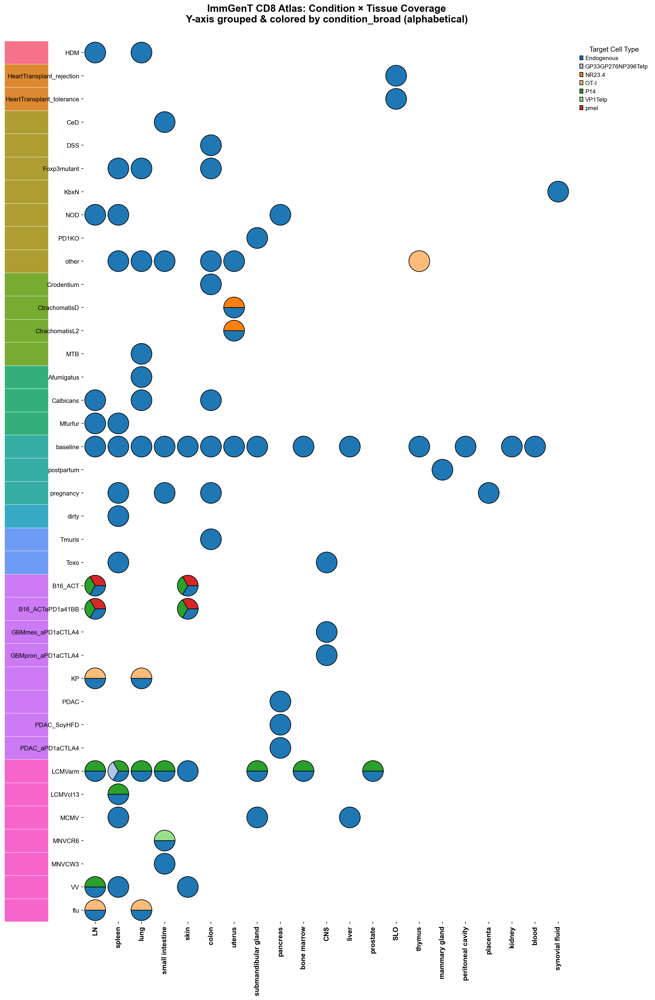

Done!
83 combinations | 38 detailed conditions


In [6]:
# Fig. 1e — atlas dot plot (transgenic cells)
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# ================== 1. Load observation metadata ==================
df = mdata['RNA'].obs.copy()

# Ensure key columns are strings
for col in ['Ag_spe_v1', 'condition_broad', 'organ_simplified', 'condition_detailed_simplified', 'sample_code']:
    df[col] = df[col].astype(str)

# Label standardization (match atlas heatmap)
df['Ag_spe_v1'] = df['Ag_spe_v1'].str.strip()
df['Ag_spe_v1'] = df['Ag_spe_v1'].replace(['all T', 'allT', 'All T'], 'all CD8', regex=True)

def add_cd8_prefix(label):
    if pd.isna(label):
        return label
    s = str(label).strip()
    if s.startswith('CD8') or s == 'all CD8':
        return s
    if s.endswith(' T') or s.endswith('T'):
        return f"CD8 {s.rstrip(' T').rstrip('T').strip()}"
    return s

df['Ag_spe_v1'] = df['Ag_spe_v1'].apply(add_cd8_prefix)
df['Ag_spe_v1'] = df['Ag_spe_v1'].str.replace('splenocytes', 'CD45+', regex=False)
df['Ag_spe_v1'] = df['Ag_spe_v1'].str.replace('CD8\+', 'CD8', regex=True)
df['Ag_spe_v1'] = df['Ag_spe_v1'].str.replace('CD8 T', 'CD8', regex=True)
df['Ag_spe_v1'] = df['Ag_spe_v1'].str.replace('OT1', 'OT-I', regex=True)
df['Ag_spe_v1'] = df['Ag_spe_v1'].str.replace('all CD8', 'CD8', regex=False)
df['Ag_spe_v1'] = df['Ag_spe_v1'].str.replace('CD44+ T', 'CD44+', regex=False)

# Clean broad names
df['condition_broad'] = df['condition_broad'].str.replace('cancer', 'tumor', regex=False, case=False)
df['condition_broad'] = df['condition_broad'].str.replace('autoimmune', 'autoimmunity', regex=False, case=False)

special_markers = ['CD44+', 'VP1', 'PLZF+', 'Ly49', 'NK1.1', 'KLRG1+', 'CD69+', 'CD103+',
                   'CD62L-', 'CD27-', 'CD127-', 'Tbet+', 'Eomes+', 'Blimp1+', 'Granzyme+',
                   'iNKT', 'MAIT', 'NKT', 'γδ', 'Vd6b', 'Vg4', 'Vg6', 'Vg7']

pattern = r'CD8\s+(?=' + '|'.join([f'.*{m}' for m in special_markers]) + r')'
df['Ag_spe_v1'] = df['Ag_spe_v1'].str.replace(pattern, '', regex=True)

for m in special_markers:
    df['Ag_spe_v1'] = df['Ag_spe_v1'].str.replace(rf'CD8\s+{m}(\s|$)', m + ' ', regex=True)

print("Light label standardization complete (matching atlas1).")

# === Filter to good samples from CSV ===
selected_samples_path = './Fig_1e_selected_samples.csv'
selected_df = pd.read_csv(selected_samples_path)
selected_sample_codes = selected_df['sample_code'].astype(str).unique()

n_before = len(df)
df = df[df['sample_code'].isin(selected_sample_codes)].copy()
print(f"Filtered to good samples: kept {len(df)} / {n_before} cells "
      f"({len(selected_sample_codes)} samples)")

# Optional: also remove the specific unwanted conditions (like in atlas1)
unwanted_conditions = ['KbDbKO', 'KbDbQa1KO', 'NP_OVA', 'KbDbQa1KO_MCMV']
df = df[~df['condition_detailed_simplified'].isin(unwanted_conditions)].copy()
print(f"Additionally removed conditions: {unwanted_conditions}")

print(f"Final rows after all filtering: {len(df)}")

# ================== DATA PREP ==================
dfu = df[['condition_detailed_simplified', 'condition_broad', 'organ_simplified', 'Ag_spe_v1']].drop_duplicates()

# Alphabetical ordering
dfu = dfu.sort_values(['condition_broad', 'condition_detailed_simplified']).reset_index(drop=True)
conditions = dfu['condition_detailed_simplified'].unique()
cond_to_idx = {cond: i for i, cond in enumerate(conditions)}

present_pairs = dfu.groupby(['condition_detailed_simplified', 'organ_simplified']).size()
present_pairs = present_pairs[present_pairs > 0].index.tolist()

tissue_counts = dfu.groupby('organ_simplified').size()
tissues = tissue_counts.sort_values(ascending=False).index.tolist()
tissue_to_idx = {t: j for j, t in enumerate(tissues)}

print(f"Showing {len(present_pairs)} profiled combinations")

presence_dict = dfu.groupby(['condition_detailed_simplified', 'organ_simplified'])['Ag_spe_v1']\
    .apply(lambda x: sorted(set(x))).to_dict()

# Colors
colors = sns.color_palette("tab20") + sns.color_palette("tab20b") + sns.color_palette("tab20c")
all_targets = sorted(dfu['Ag_spe_v1'].unique())
target_color = dict(zip(all_targets, colors[:len(all_targets)]))

unique_broad = dfu['condition_broad'].dropna().unique()
broad_palette = sns.color_palette("husl", len(unique_broad))
broad_color_map = dict(zip(unique_broad, broad_palette))

broad_colors_for_rows = [
    broad_color_map[dfu[dfu['condition_detailed_simplified'] == cond]['condition_broad'].iloc[0]]
    for cond in conditions
]

# ================== PLOT ==================
fig = plt.figure(figsize=(17, len(conditions) * 0.6 + 3))
gs = fig.add_gridspec(1, 2, width_ratios=[0.08, 1], wspace=0.02)

# Left color bar
ax_colorbar = fig.add_subplot(gs[0])
ax_colorbar.set_xlim(0, 1)
ax_colorbar.set_ylim(0, len(conditions))
ax_colorbar.invert_yaxis()
ax_colorbar.axis('off')
for i, color in enumerate(broad_colors_for_rows):
    ax_colorbar.add_patch(plt.Rectangle((0, i), 1, 1, facecolor=color, edgecolor='white', linewidth=0.5))

# Main plot
ax = fig.add_subplot(gs[1])
cell_size = 0.9
border = 1.0

for cond, tissue in present_pairs:
    i = cond_to_idx[cond]
    j = tissue_to_idx[tissue]
    cx = j + 0.5
    cy = i + 0.5
    targets = presence_dict[(cond, tissue)]
    cols = [target_color[t] for t in targets]
    ax.pie([1] * len(targets),
           center=(cx, cy),
           radius=cell_size / 2,
           colors=cols,
           wedgeprops=dict(width=cell_size/2, edgecolor='black', linewidth=border))

ax.set_xticks(np.arange(len(tissues)) + 0.5)
ax.set_yticks(np.arange(len(conditions)) + 0.5)
ax.set_xticklabels(tissues, rotation=90, ha='center', fontsize=11, fontweight='bold')
ax.set_yticklabels(conditions, fontsize=10)
ax.set_xlim(0, len(tissues))
ax.set_ylim(0, len(conditions))
ax.set_aspect('equal')
ax.invert_yaxis()
ax.grid(False)

# Legend
handles = [plt.Rectangle((0,0),1,1, facecolor=target_color[t], edgecolor='black', lw=1) for t in all_targets]
ax.legend(handles, all_targets, title='Target Cell Type',
          bbox_to_anchor=(1.01, 1), loc='upper left', fontsize=9.5, title_fontsize=11, frameon=False)

ax.set_title('ImmGenT CD8 Atlas: Condition × Tissue Coverage\n'
             'Y-axis grouped & colored by condition_broad (alphabetical)',
             fontsize=16, fontweight='bold', pad=30)

plt.tight_layout()
with plt.rc_context({'pdf.fonttype': 42, 'pdf.compression': 0}):
    plt.savefig('Fig_1e_v2.pdf', dpi=600, bbox_inches='tight', facecolor='white', edgecolor='none')

plt.show()
print("Done!")
print(f"{len(present_pairs)} combinations | {len(conditions)} detailed conditions")


# Fig. 2

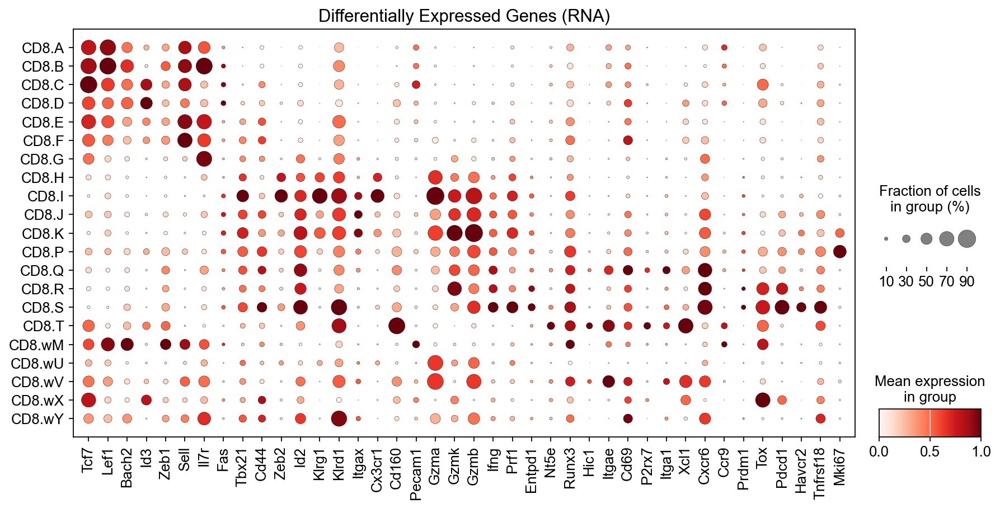

Plot saved: Fig_2a.pdf


In [8]:
# Fig. 2a — Genes dot plot
selected_genes = ["Tcf7", "Lef1", "Bach2", "Id3", "Zeb1", "Sell", "Il7r", "Fas", "Tbx21", "Cd44", "Zeb2", "Id2", "Klrg1", "Klrd1", "Itgax", "Cx3cr1", "Cd160", "Pecam1", "Gzma", "Gzmk", "Gzmb", "Ifng", "Prf1", "Entpd1", "Nt5e", "Runx3", "Hic1", "Itgae", "Cd69", "P2rx7", "Itga1", "Xcl1", "Cxcr6", "Ccr9", "Prdm1", "Tox", "Pdcd1", "Havcr2", "Tnfrsf18", "Mki67",]

sc.pl.dotplot(rna, var_names=list(selected_genes), groupby='cluster_annotation', 
              use_raw=False,  # Set to True if .X is raw and you have .raw
              cmap='Reds',  # Color map for expression
              title='Differentially Expressed Genes (RNA)',
              standard_scale='var',  # Scale by variable (gene)
              figsize=(13, 6),  # Try passing figsize directly
              show=False)
plt.savefig('Fig_2a.pdf', format='pdf', bbox_inches='tight')
plt.show()
plt.close()

print('Plot saved: Fig_2a.pdf')


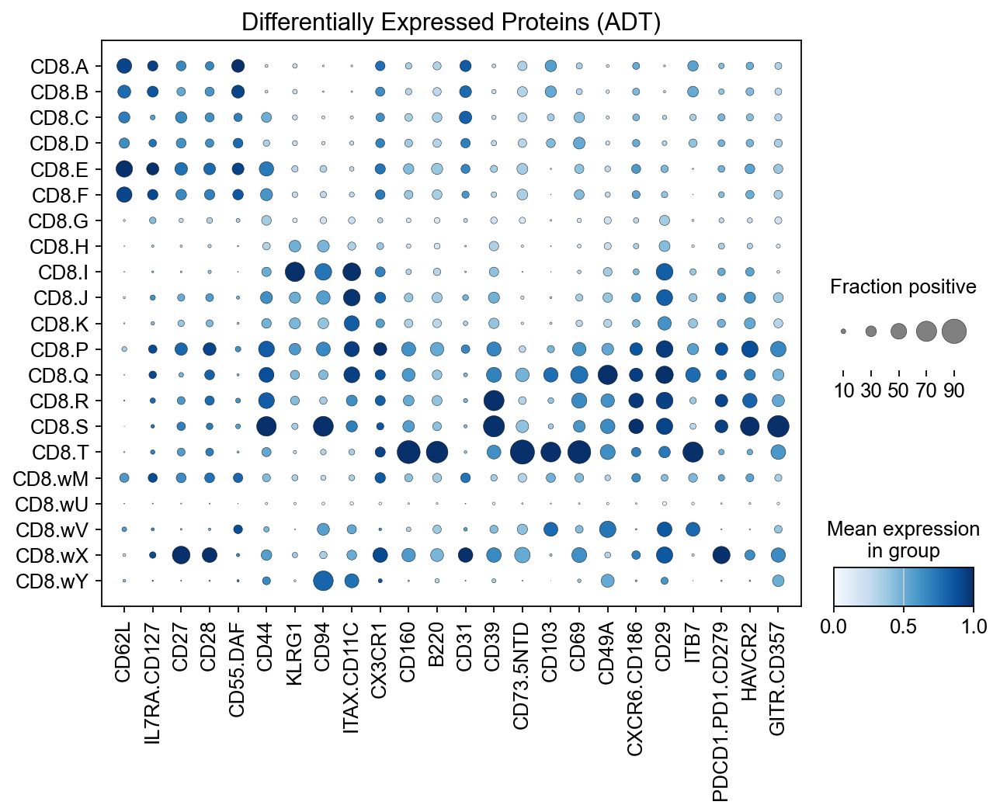

Plot saved: Fig_2a_v2.pdf


In [9]:
# Fig. 2a — Proteins dot plot
selected_proteins = ['CD62L', 'IL7RA.CD127', 'CD27', 'CD28', 'CD55.DAF', 'CD44', 'KLRG1', 'CD94', 'ITAX.CD11C', 'CX3CR1', 'CD160', 'B220', 'CD31', 'CD39', 'CD73.5NTD', 'CD103', 'CD69', 'CD49A', 'CXCR6.CD186', 'CD29', 'ITB7', 'PDCD1.PD1.CD279', 'HAVCR2', 'GITR.CD357']

sc.pl.dotplot(adt, 
              var_names=selected_proteins, 
              groupby='cluster_annotation',
              use_raw=False,
              cmap='Blues', 
              title='Differentially Expressed Proteins (ADT)',
              standard_scale='var', 
              figsize=(9, 6),
              expression_cutoff=0.75,  # This sets the positivity threshold
              size_title='Fraction positive',
              show=False)

plt.savefig('Fig_2a_v2.pdf', format='pdf', bbox_inches='tight')
plt.show()
plt.close()

print('Plot saved: Fig_2a_v2.pdf')

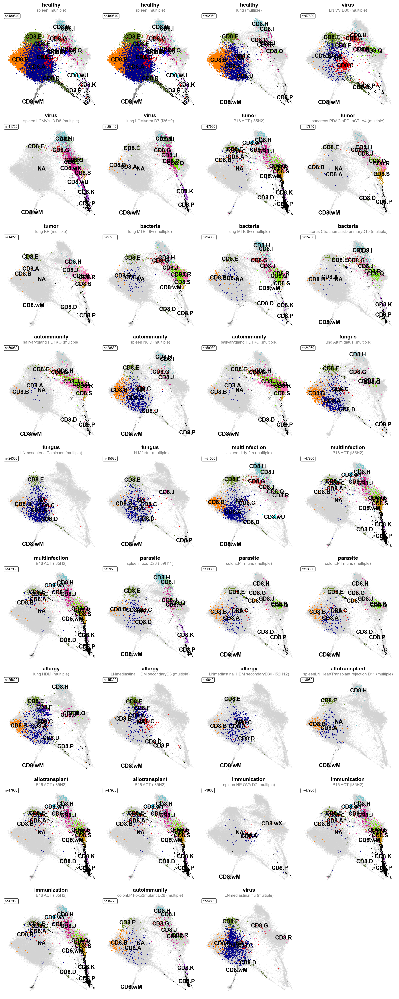

Combined plot saved: Fig_2b.pdf
Plotted conditions (up to 3 per broad, preferring different IGT + 2 extras):
 • healthy → spleen | IGTHT: multiple
 • healthy → spleen | IGTHT: multiple
 • healthy → lung | IGTHT: multiple
 • virus → LN VV D80 | IGTHT: multiple
 • virus → spleen LCMVcl13 D8 | IGTHT: multiple
 • virus → lung LCMVarm D7 | IGTHT: I36H9
 • tumor → B16 ACT | IGTHT: I35H2
 • tumor → pancreas PDAC aPD1aCTLA4 | IGTHT: multiple
 • tumor → lung KP | IGTHT: multiple
 • bacteria → lung MTB 49w | IGTHT: multiple
 • bacteria → lung MTB 6w | IGTHT: multiple
 • bacteria → uterus CtrachomatisD primaryD15 | IGTHT: multiple
 • autoimmunity → salivarygland PD1KO | IGTHT: multiple
 • autoimmunity → spleen NOD | IGTHT: multiple
 • autoimmunity → salivarygland PD1KO | IGTHT: multiple
 • fungus → lung Afumigatus | IGTHT: multiple
 • fungus → LNmesenteric Calbicans | IGTHT: multiple
 • fungus → LN Mfurfur | IGTHT: multiple
 • multiinfection → spleen dirty 2m | IGTHT: multiple
 • multiinfection →

In [10]:
# Fig. 2b — multi-condition MDE gallery
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import pandas as pd

# ------------------------------------------------------------------
# Automatically find up to TOP 3 condition_detailed_organ with most ENDOGENOUS cells
# for EACH condition_broad — preferring different IGT values — excluding spleen_NP_OVA and spleen_KbDbQa1KO
# ------------------------------------------------------------------
endo_obs = rna.obs[rna.obs['Ag_spe_v1'].str.lower() == 'endogenous'].copy()
# Exclude unwanted detailed conditions (case-insensitive)
exclude_patterns = ['spleen_NP_OVA', 'spleen_KbDbQa1KO']
mask_exclude = ~endo_obs['condition_detailed_organ'].str.lower().str.contains('|'.join(exclude_patterns))
endo_obs_filtered = endo_obs[mask_exclude]
# Add IGT for diversity selection
# (assuming 'IGT' is string or can be converted to str; NaN → 'unknown')
endo_obs_filtered['IGT_str'] = endo_obs_filtered['IGT'].astype(str).replace('nan', 'unknown')
# Group and count endogenous cells per (broad, detailed)
counts = (
    endo_obs_filtered
    .groupby(['condition_broad', 'condition_detailed_organ', 'IGT_str'])
    .size()
    .reset_index(name='n_endo')
)
# For each broad, sort by n_endo descending
counts = counts.sort_values(['condition_broad', 'n_endo'], ascending=[True, False])

# Select up to 3 per broad, preferring different IGT
selected = []
for broad, group in counts.groupby('condition_broad'):
    if group.empty:
        continue
    # Take the absolute top one
    top1 = group.iloc[0]
    selected.append(top1)
    
    # Remaining after top1
    remaining = group.iloc[1:]
    
    # Try to find a second one with different IGT
    different_igt = remaining[remaining['IGT_str'] != top1['IGT_str']]
    if not different_igt.empty:
        top2 = different_igt.iloc[0]
        selected.append(top2)
        # Update remaining after adding top2
        remaining = remaining[remaining.index != top2.name]
    
    # Try to find a third one with yet another different IGT (if possible)
    different_igt_3 = remaining[~remaining['IGT_str'].isin([top1['IGT_str']] + ([top2['IGT_str']] if 'top2' in locals() else []))]
    if not different_igt_3.empty:
        top3 = different_igt_3.iloc[0]
        selected.append(top3)

# Create final lists from automatic selection
selected_df = pd.DataFrame(selected)
broad_list = selected_df['condition_broad'].tolist()
detailed_list = selected_df['condition_detailed_organ'].tolist()

# ────────────────────────────────────────────────
# Force-add two extra specific conditions at the end (if not already present)
extra_detailed = ['colonLP_Foxp3mutant_D28', 'LNmediastinal_flu']

for extra_cond in extra_detailed:
    if extra_cond not in detailed_list:
        # Find the broad category for this condition
        matching_broad = rna.obs.loc[
            rna.obs['condition_detailed_organ'] == extra_cond,
            'condition_broad'
        ].unique()
        
        if len(matching_broad) == 1:
            broad_list.append(matching_broad[0])
            detailed_list.append(extra_cond)
        elif len(matching_broad) > 1:
            # Rare edge case: ambiguous broad → pick first or skip/log
            broad_list.append(matching_broad[0])
            detailed_list.append(extra_cond)
        # if no match → silently skip (or you can raise warning)

# ────────────────────────────────────────────────
n_broad = len(broad_list)
n_cols = 4
n_rows = int(np.ceil(n_broad / n_cols))

# --------------------------------------------------------------
# Figure size control
# --------------------------------------------------------------
width_per_plot = 3.4
height_per_plot = 3.8
fig, axes = plt.subplots(n_rows, n_cols,
                         figsize=(width_per_plot * n_cols, height_per_plot * n_rows),
                         constrained_layout=True)
axes = axes.flatten()
default_color = "#BAB0AC"

# Pre-compute IGTHT info
igtht_info_list = []
for broad, condition in zip(broad_list, detailed_list):
    mask = (
        (rna.obs['condition_detailed_organ'] == condition) &
        (rna.obs['Ag_spe_v1'].str.lower() == 'endogenous')
    )
    igtht_values = rna.obs.loc[mask, 'IGTHT'].dropna().unique()
    if len(igtht_values) == 1:
        igtht_str = str(igtht_values[0])
    elif len(igtht_values) > 1:
        igtht_str = "multiple"
    else:
        igtht_str = "unknown"
    igtht_info_list.append(igtht_str)

# Plotting loop
for idx, ((broad, condition), ax, igtht_str) in enumerate(zip(zip(broad_list, detailed_list), axes, igtht_info_list)):
    # Highlight ALL endogenous cells from the selected detailed condition
    rna.obs['highlight_color'] = np.where(
        (rna.obs['condition_detailed_organ'] == condition) &
        (rna.obs['Ag_spe_v1'].str.lower() == 'endogenous'),
        rna.obs['cluster_annotation'],
        np.nan
    )
    sizes = np.where(rna.obs['highlight_color'].notnull(), 20, 1)
    
    # Only label clusters that have >10 highlighted cells
    highlighted_mask = rna.obs['highlight_color'].notnull()
    cluster_counts = rna.obs.loc[highlighted_mask, 'cluster_annotation'].value_counts()
    large_clusters = cluster_counts[cluster_counts > 10].index
    
    # Label only large clusters; small ones get NaN → no label
    rna.obs['highlight_color_clean'] = np.where(
        highlighted_mask & rna.obs['cluster_annotation'].isin(large_clusters),
        rna.obs['cluster_annotation'],
        np.nan
    )
    
    # ────────────────────────────────────────────────
    # Plot: color by the filtered labels (small clusters colored but unlabeled)
    sc.pl.embedding(
        rna,
        basis="MDE_INCREMENTAL",
        color="highlight_color_clean",          # this controls both color AND which get labels
        palette=custom_colors,
        legend_loc='on data',
        ax=ax,
        size=sizes,
        show=False,
        title="",
        frameon=False
    )
    
    # Main title (broad condition)
    ax.set_title(broad, fontsize=13, fontweight='bold', pad=15)
    
    # Subtitle: detailed organ + IGTHT info
    subtitle = condition.replace('_', ' ')
    if igtht_str != "unknown":
        subtitle += f" ({igtht_str})"
    ax.text(0.5, 1.01, subtitle,
            transform=ax.transAxes, fontsize=10, ha='center', color='gray')
    
    # Cell count
    n_highlighted = sizes[sizes == 20].sum()
    ax.text(0.02, 0.98, f'n={n_highlighted}', transform=ax.transAxes,
            fontsize=8, verticalalignment='top',
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

# Hide unused subplots
for idx in range(n_broad, len(axes)):
    axes[idx].axis('off')

# ------------------------------------------------------------------
plt.savefig("Fig_2b.pdf", bbox_inches="tight")
plt.show()
plt.close()

# Clean up
rna.obs.drop(columns=['highlight_color', 'highlight_color_clean'], errors='ignore', inplace=True)

print("Combined plot saved: Fig_2b.pdf")
print("Plotted conditions (up to 3 per broad, preferring different IGT + 2 extras):")
for b, d, i in zip(broad_list, detailed_list, igtht_info_list):
    igtht_display = i if i != "unknown" else "(no IGTHT info)"
    print(f" • {b} → {d.replace('_', ' ')} | IGTHT: {igtht_display}")


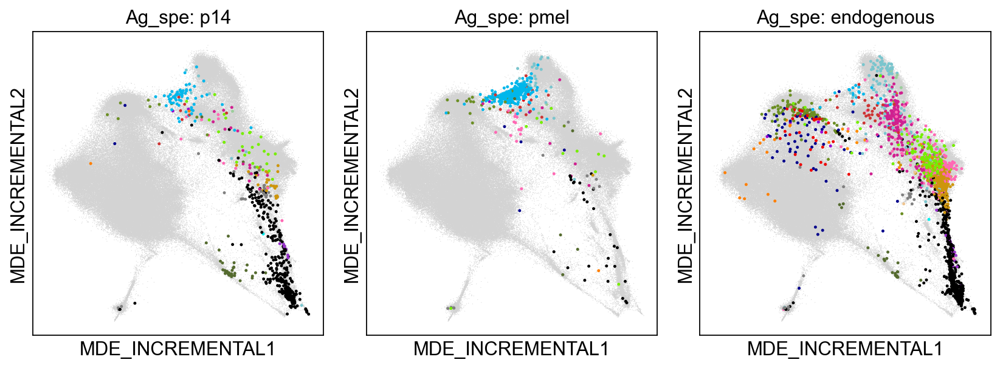

Combined plot saved: Fig_2c.pdf


In [11]:
# Fig. 2c — melanoma B16 tumor on MDE
# Antigen-specificity groups to highlight
ag_spe_values = ['p14', 'pmel', 'endogenous']

# Gray background for non-highlighted cells
default_color = '#BAB0AC'  # Gray for cells not meeting the condition

# Three-panel layout
fig, axes = plt.subplots(1, 3, figsize=(10.5, 4))  # 3 subplots horizontally, adjusted size

# Iterate over Ag_spe values and corresponding axes
for idx, (ag_spe, ax) in enumerate(zip(ag_spe_values, axes)):
    # Create a new column for coloring based on conditions
    rna.obs['highlight_color'] = np.where(
        (rna.obs['IGT'] == 'IGT35') & 
        (rna.obs['sample_name'].str.lower().str.endswith('tumor')) & 
        (~rna.obs['condition_detailed_organ'].str.lower().str.contains('apd1a41bb')) &
        (rna.obs['Ag_spe_v1'].str.lower() == ag_spe),
        rna.obs['cluster_annotation'],  # Use cluster_annotation for highlighted cells
        None  # None for cells that don't meet the condition
    )
    
    # Set dot sizes: larger for highlighted cells
    sizes = np.where(rna.obs['highlight_color'].notnull(), 20, 1)
    
    # Plot MDE
    sc.pl.embedding(
        rna,
        basis="MDE_INCREMENTAL",
        color="highlight_color",
        palette=custom_colors,
        legend_loc=None,  # No legend
        ax=ax,
        size=sizes,
        show=False,
        title=f"Ag_spe: {ag_spe}"  # Add Ag_spe value as subplot title
    )

# Adjust layout to prevent overlap
plt.tight_layout()

# Save and show the combined plot
plt.savefig("Fig_2c.pdf", bbox_inches="tight")
plt.show()
plt.close()

print("Combined plot saved: Fig_2c.pdf")

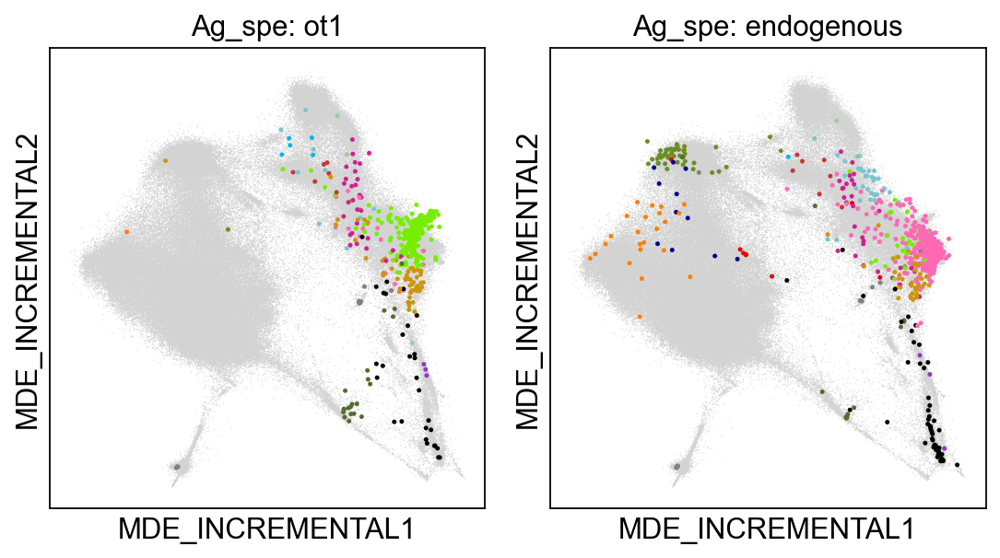

Combined plot saved: Fig_2c_v2.pdf


In [12]:
# Fig. 2c — lung KP tumor on MDE
# Antigen-specificity groups to highlight
ag_spe_values = ['ot1', 'endogenous']

# Gray background for non-highlighted cells
default_color = '#BAB0AC'  # Gray for cells not meeting the condition

# Two-panel layout
fig, axes = plt.subplots(1, 2, figsize=(7, 4))  # 2 subplots horizontally, adjusted size

# Iterate over Ag_spe values and corresponding axes
for idx, (ag_spe, ax) in enumerate(zip(ag_spe_values, axes)):
    # Create a new column for coloring based on conditions
    rna.obs['highlight_color'] = np.where(
        (rna.obs['IGT'].isin(['IGT95', 'IGT96'])) & 
        (rna.obs['condition_detailed_organ'] == 'lung_KP') & 
        (rna.obs['Ag_spe_v1'].str.lower() == ag_spe),
        rna.obs['cluster_annotation'],  # Use cluster_annotation for highlighted cells
        None  # None for cells that don't meet the condition
    )
    
    # Set dot sizes: larger for highlighted cells
    sizes = np.where(rna.obs['highlight_color'].notnull(), 20, 1)
    
    # Plot MDE
    sc.pl.embedding(
        rna,
        basis="MDE_INCREMENTAL",
        color="highlight_color",
        palette=custom_colors,
        legend_loc=None,  # No legend
        ax=ax,
        size=sizes,
        show=False,
        title=f"Ag_spe: {ag_spe}"  # Add Ag_spe value as subplot title
    )

# Adjust layout to prevent overlap
plt.tight_layout()

# Save and show the combined plot
plt.savefig("Fig_2c_v2.pdf", bbox_inches="tight")
plt.show()
plt.close()

print("Combined plot saved: Fig_2c_v2.pdf")

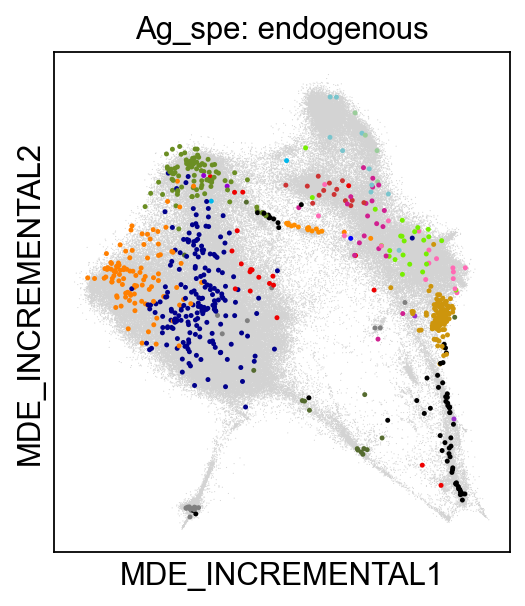

Plot saved: Fig_2c_v3.pdf


In [13]:
# Fig. 2c — pancreatic PDAC tumor on MDE
# Antigen-specificity group to highlight
ag_spe = 'endogenous'

# Gray background for non-highlighted cells
default_color = '#BAB0AC'  # Gray for cells not meeting the condition

# Set up the figure with one subplot
fig, ax = plt.subplots(1, 1, figsize=(3.5, 4))

# Create a new column for coloring based on conditions
rna.obs['highlight_color'] = np.where(
    (rna.obs['IGT'].isin(['IGT64', 'IGT65'])) &
    (rna.obs['condition_detailed_organ'] == 'pancreas_PDAC') &
    (rna.obs['Ag_spe_v1'].str.lower() == ag_spe),
    rna.obs['cluster_annotation'],  # Use cluster_annotation for highlighted cells
    None  # None for cells that don't meet the condition
)

# Set dot sizes: larger for highlighted cells
sizes = np.where(rna.obs['highlight_color'].notnull(), 20, 1)

# Plot MDE
sc.pl.embedding(
    rna,
    basis="MDE_INCREMENTAL",
    color="highlight_color",
    palette=custom_colors,  # Ensure custom_colors is defined
    legend_loc=None,  # No legend
    ax=ax,
    size=sizes,
    show=False,
    title=f"Ag_spe: {ag_spe}"  # Add Ag_spe value as plot title
)

# Adjust layout
plt.tight_layout()

# Save and show the plot
plt.savefig("Fig_2c_v3.pdf", bbox_inches="tight")
plt.show()
plt.close()

print("Plot saved: Fig_2c_v3.pdf")

Comparing only: ['CD8.A', 'CD8.B']
CD8.A cells: 67743
CD8.B cells: 22986
Strongest factor for CD8.A: F9 (log2FC = 0.394)
Strongest factor for CD8.B: F11 (log2FC = -0.573)

Exact mean factor loadings for the top gene programs:
factor      F11      F9
cluster                
CD8.A    0.2142  0.6150
CD8.B    0.6114  0.3422

Detailed values:
CD8.A:
  F9: 0.6150
  F11: 0.2142
CD8.B:
  F9: 0.3422
  F11: 0.6114


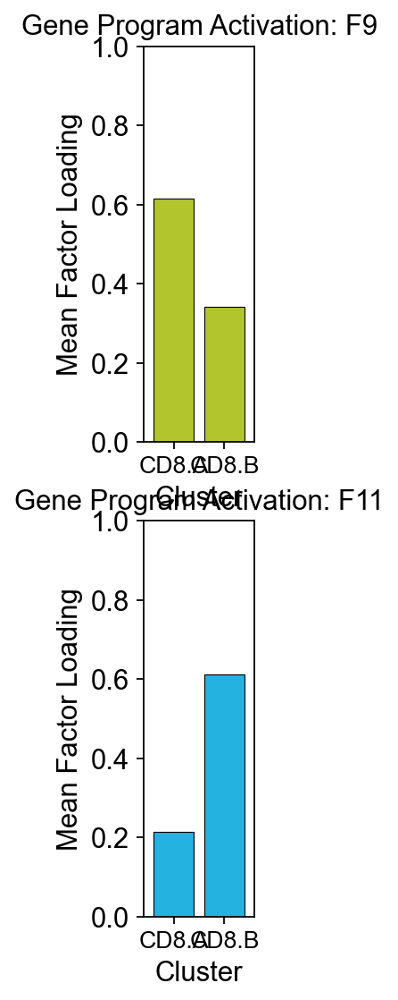

In [14]:
# Fig. 2d-e — GP analysis on CD8.A and CD8.B
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load matrices (keep as before)
F_df = pd.read_csv("data/gene_factor_matrix.txt", sep="\t", index_col=0)
L_df = pd.read_csv("data/cell_factor_matrix.txt.gz", sep="\t", index_col=0, compression="gzip")

F_np = F_df.to_numpy()
L_np = L_df.to_numpy()

factor_names = L_df.columns

# MuData handling
mdata_obs = mdata['RNA'].obs
cell_id_col = 'cellID' if 'cellID' in mdata_obs.columns else 'IGT_cellID'

# Define the two clusters only
target_clusters = ['CD8.A', 'CD8.B']
unique_clusters = ['CD8.A', 'CD8.B']  # Only these two

print("Comparing only:", unique_clusters)

# Function to compute log2FC: CD8.A vs CD8.B
def compute_factor_log2fc(L_np, group1_cells, group2_cells, factor_names):
    group1_idx = [L_df.index.get_loc(g) for g in group1_cells if g in L_df.index]
    group2_idx = [L_df.index.get_loc(g) for g in group2_cells if g in L_df.index]
    if not group1_idx or not group2_idx:
        return None
    loadings_group1 = L_np[group1_idx].mean(axis=0)
    loadings_group2 = L_np[group2_idx].mean(axis=0)
    fc_loadings = loadings_group1 - loadings_group2
    return pd.DataFrame({'SYMBOL': factor_names, 'log2FC': fc_loadings / np.log(2)})

# Get cells
CD8_A_cells = mdata_obs[mdata_obs['cluster_annotation'] == 'CD8.A'][cell_id_col].tolist()
CD8_B_cells = mdata_obs[mdata_obs['cluster_annotation'] == 'CD8.B'][cell_id_col].tolist()

print(f"CD8.A cells: {len(CD8_A_cells)}")
print(f"CD8.B cells: {len(CD8_B_cells)}")

log2fc_df = compute_factor_log2fc(L_np, CD8_A_cells, CD8_B_cells, factor_names)

# Remove F1 and select strongest in each direction
log2fc_df = log2fc_df[log2fc_df['SYMBOL'] != 'F1']

strongest_CD8_A = log2fc_df.loc[log2fc_df['log2FC'].idxmax()]  # Highest positive = most enriched in CD8_A
strongest_CD8_B = log2fc_df.loc[log2fc_df['log2FC'].idxmin()]  # Lowest negative = most enriched in CD8_B

top_factors = [strongest_CD8_A['SYMBOL'], strongest_CD8_B['SYMBOL']]

print(f"Strongest factor for CD8.A: {strongest_CD8_A['SYMBOL']} (log2FC = {strongest_CD8_A['log2FC']:.3f})")
print(f"Strongest factor for CD8.B: {strongest_CD8_B['SYMBOL']} (log2FC = {strongest_CD8_B['log2FC']:.3f})")

# Compute mean loadings for these two factors in the two clusters
cluster_loadings = []
for cluster in unique_clusters:
    cells = mdata_obs[mdata_obs['cluster_annotation'] == cluster][cell_id_col].tolist()
    idx = [L_df.index.get_loc(g) for g in cells if g in L_df.index]
    if idx:
        mean_loadings = L_np[idx].mean(axis=0)
        for factor in top_factors:
            factor_idx = list(factor_names).index(factor)
            cluster_loadings.append({
                'cluster': cluster,
                'factor': factor,
                'mean_loading': mean_loadings[factor_idx]
            })

loadings_df = pd.DataFrame(cluster_loadings)
pivot_df = loadings_df.pivot(index='cluster', columns='factor', values='mean_loading')

# Ensure order
pivot_df = pivot_df.reindex(unique_clusters)

# Print the exact mean loadings for the strongest factors in each cluster
print("\nExact mean factor loadings for the top gene programs:")
print(pivot_df.round(4))  # Round to 4 decimals for readability, adjust as needed

# Alternatively, for a more verbose readout:
print("\nDetailed values:")
for cluster in unique_clusters:
    print(f"{cluster}:")
    for factor in top_factors:
        value = pivot_df.loc[cluster, factor]
        print(f"  {factor}: {value:.4f}")

# === Plotting (adapted from your code) ===
fig, axes = plt.subplots(nrows=len(top_factors), ncols=1, figsize=(1, 4 * len(top_factors)))
if len(top_factors) == 1:
    axes = [axes]

# Colors: one for each factor
colors = ["#b3c52d", "#24b2e1"]

for i, (factor, ax) in enumerate(zip(top_factors, axes)):
    x = np.arange(len(unique_clusters))
    # Bar plot
    bars = ax.bar(x, pivot_df[factor], color=colors[i], label=factor)
    
    # Highlight both clusters with black edge (since we only have two, both are "target")
    for j in x:
        ax.bar(j, pivot_df[factor].iloc[j], color=colors[i], edgecolor='black', linewidth=0.5)
    
    # Customize
    ax.set_xlabel('Cluster')
    ax.set_ylabel('Mean Factor Loading')
    ax.set_title(f'Gene Program Activation: {factor}')
    ax.set_xticks(x)
    ax.set_ylim(0, 1)  # Set consistent y-axis limit
    ax.set_xticklabels(['CD8.A', 'CD8.B'], fontsize=12)
    ax.grid(False)
    ax.set_xlim(-0.6, len(unique_clusters) - 0.4)

plt.tight_layout()
plt.savefig('Fig_2d-e.pdf', dpi=300, bbox_inches='tight', format='pdf')
plt.show()


Top 30 driver genes for F9:
['Cdk8', 'Cmss1', 'CT010467.1', 'Tmsb10', 'Eef2', 'Myh9', 'Fau', 'Hexb', 'Msn', 'Mir6236', 'Filip1l', 'Tmsb4x', 'Ucp2', 'Malat1', 'Ddx5', 'Actb', 'Camk1d', 'Hnrnpu', 'Lars2', 'Cd52', 'Zc3h7a', 'Il31ra', 'Eef1a1', 'Lcp1', 'Tcf7', 'Coro1a', 'Dgka', 'Gphn', 'Eif1', 'Atp5e']

Top 30 driver genes for F11:
['Vps37b', 'Gramd3', 'Dusp10', 'Junb', 'Ccr7', 'Ifngr1', 'Pnrc1', 'H3f3b', 'Srgn', 'Btg1', 'Eif1', 'Emb', 'Jund', 'Tnfaip3', 'Itk', 'Cblb', 'Stk17b', 'Gimap6', 'Cytip', 'Klf2', 'Satb1', 'Cd52', 'Ltb', 'Tmem64', 'Fam107b', 'Tsc22d3', 'Fth1', 'S1pr1', 'Gpr132', 'Zc3hav1']

Mean expression shape: (55494, 2)
No forced genes for F9
No forced genes for F11

=== F9: Top 30 genes with highest mean expression difference ===
(higher in CD8.A, from factor drivers, min expr > 0.1)
['Cnn2', 'Ddit4', 'Cd8a', 'Coro1a', 'Stat1', 'Dtx1', 'Ifi208', 'Tespa1', 'Rbm38', 'Myh9', 'Slc16a5', 'Fubp1', 'Treml2', 'Ccnd2', 'Ramp1', 'Fchsd2', 'Arl4c', 'Dennd2d', 'Cd8b1', 'Slfn5', 'Srm', 'Cd

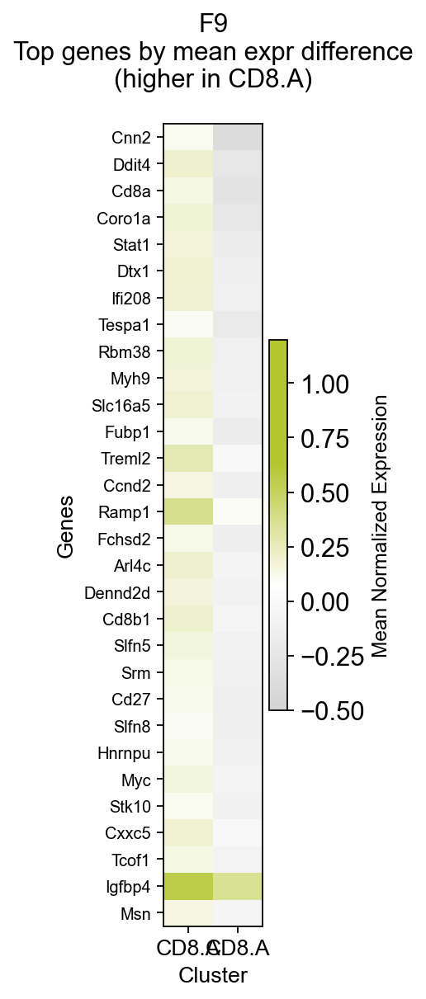

Saved: Fig_2d-e_v2_F9.pdf



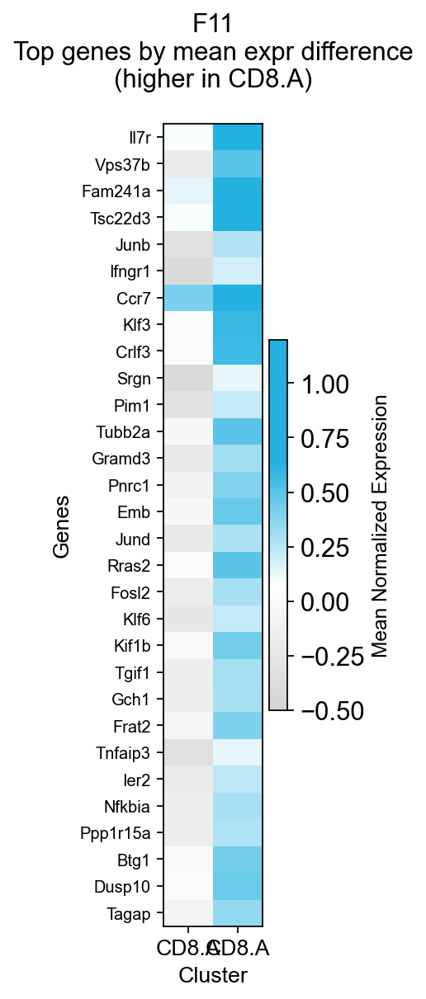

Saved: Fig_2d-e_v2_F11.pdf



In [15]:
# Fig. 2d-e — GP analysis on CD8.A and CD8.B
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import numpy as np
import pandas as pd
import scipy.sparse as sparse

# Move scaled to X
mdata['RNA'].X = mdata['RNA'].layers['scaled']

gene_names = F_df.index.tolist()

# === Extract FULL ranked driver genes from loadings ===
factor_genes_full = {}
for factor in top_factors:
    factor_idx = list(factor_names).index(factor)
    gene_loadings = pd.Series(F_np[:, factor_idx], index=gene_names)
    sorted_genes = gene_loadings.abs().sort_values(ascending=False)
    factor_genes_full[factor] = sorted_genes.index.tolist()

# Optional: print top 30 drivers
for factor in top_factors:
    print(f"Top 30 driver genes for {factor}:")
    print(factor_genes_full[factor][:30])
    print()

# === Compute mean expression per cluster ===
unique_clusters = ['CD8.A', 'CD8.B']
cluster_mask = mdata_obs['cluster_annotation'].isin(unique_clusters)
cluster_labels = mdata_obs[cluster_mask]['cluster_annotation'].values
expr_data = mdata['RNA'].X[cluster_mask]

unique_labels, inverse = np.unique(cluster_labels, return_inverse=True)
n_genes = expr_data.shape[1]
mean_expr_matrix = np.empty((len(unique_labels), n_genes))

for i, label in enumerate(unique_labels):
    mask_i = (inverse == i)
    if sparse.issparse(expr_data):
        mean_expr_matrix[i] = np.ravel(expr_data[mask_i].mean(axis=0))
    else:
        mean_expr_matrix[i] = expr_data[mask_i].mean(axis=0)

mean_expr_pivot = pd.DataFrame(
    mean_expr_matrix,
    index=unique_labels,
    columns=mdata['RNA'].var_names
).T

mean_expr_pivot = mean_expr_pivot[unique_clusters]
print("Mean expression shape:", mean_expr_pivot.shape)

# === Target clusters per factor ===
factor_to_cluster = {'F9': 'CD8.A', 'F11': 'CD8.B'}

# === Manual genes to force-include (only if higher MEAN in target cluster and in factor) ===
manual_genes = {
    'F9': [],   # add your manual genes here if any
    'F11': []
}

allowed_genes = {factor: set(factor_genes_full[factor]) for factor in top_factors}
forced_genes = {}

for factor in top_factors:
    target = factor_to_cluster[factor]
    other = 'CD8.B' if target == 'CD8.A' else 'CD8.A'
    
    valid = []
    if factor in manual_genes:
        for g in manual_genes[factor]:
            if g in allowed_genes[factor] and mean_expr_pivot.loc[g, target] > mean_expr_pivot.loc[g, other]:
                valid.append(g)
    forced_genes[factor] = valid
    if valid:
        print(f"Forcing inclusion for {factor}: {valid}")
    else:
        print(f"No forced genes for {factor}")

# === Select top 30 cluster-specific genes by MEAN EXPRESSION DIFFERENCE ===
n_top_genes = 30
min_expr_threshold = 0.1          # lowered as requested

factor_genes_final = {}

for factor in top_factors:
    target = factor_to_cluster[factor]
    other = 'CD8.B' if target == 'CD8.A' else 'CD8.A'
    
    # Compute difference: positive = higher in target
    if target == 'CD8.A':
        delta = mean_expr_pivot['CD8.A'] - mean_expr_pivot['CD8.B']
        sorted_delta = delta.sort_values(ascending=False)
    else:
        delta = mean_expr_pivot['CD8.B'] - mean_expr_pivot['CD8.A']
        sorted_delta = delta.sort_values(ascending=False)  # still positive = better for CD8.A
    
    # Exclude ribosomal genes
    filtered = sorted_delta[~sorted_delta.index.str.startswith(('Rpl', 'Rps'))]
    
    # Require reasonable expression in at least one cluster + higher in target
    cluster_specific = filtered[
        (mean_expr_pivot.loc[filtered.index, target] > min_expr_threshold) &
        (mean_expr_pivot.loc[filtered.index, target] > mean_expr_pivot.loc[filtered.index, other])
    ]
    
    # Only keep genes from the factor's driver list
    cluster_specific = cluster_specific[cluster_specific.index.isin(allowed_genes[factor])]
    
    # Take top 30 (or all available if fewer)
    top_genes = cluster_specific.head(n_top_genes).index.tolist()
    
    # Add forced genes at the beginning (if any)
    selected_genes = list(set(forced_genes[factor])) + [g for g in top_genes if g not in forced_genes[factor]]
    
    # If after adding forced we still have < 30, we keep only what we have
    factor_genes_final[factor] = selected_genes[:n_top_genes]
    
    print(f"\n=== {factor}: Top {len(factor_genes_final[factor])} genes with highest mean expression difference ===")
    print(f"(higher in {target}, from factor drivers, min expr > {min_expr_threshold})")
    print(factor_genes_final[factor])
    print()

# === Build expression DataFrame ===
expr_data = []
for factor in top_factors:
    for gene in factor_genes_final[factor]:
        if gene in mean_expr_pivot.index:
            for cluster in unique_clusters:
                expr_data.append({
                    'factor': factor,
                    'gene': gene,
                    'cluster': cluster,
                    'mean_expr': mean_expr_pivot.loc[gene, cluster]
                })

expr_df = pd.DataFrame(expr_data)

# === Colormaps ===
colors_f9 = ["lightgray", "white", "#b3c52d", '#b3c52d']
colors_f11 = ["lightgray", "white", "#24b2e1", '#24b2e1']

cmap_f9 = LinearSegmentedColormap.from_list('cmap_f9', colors_f9)
cmap_f11 = LinearSegmentedColormap.from_list('cmap_f11', colors_f11)

colormaps = {'F9': cmap_f9, 'F11': cmap_f11}

# === Plotting: Heatmaps showing top genes by mean expression difference ===
for factor in top_factors:
    factor_df = expr_df[expr_df['factor'] == factor]
    pivot = factor_df.pivot(index='gene', columns='cluster', values='mean_expr')
    pivot = pivot[unique_clusters]
    
    # Sort by mean expression difference (highest in target at top)
    target_col = factor_to_cluster[factor]
    other_col = 'CD8.B' if target_col == 'CD8.A' else 'CD8.A'
    pivot['diff'] = pivot[target_col] - pivot[other_col]
    pivot = pivot.sort_values(by='diff', ascending=False).drop(columns='diff')
    
    fig, ax = plt.subplots(figsize=(1.2, 8))  # slightly wider and taller for clarity
    
    im = ax.imshow(
        pivot.values,
        cmap=colormaps[factor],
        aspect='auto',
        interpolation='nearest'
    )
    
    # You can keep or adjust these limits according to your actual data range
    im.set_clim(vmin=-0.5, vmax=1.2)
    
    ax.set_xticks(np.arange(len(unique_clusters)))
    ax.set_yticks(np.arange(len(pivot)))
    ax.set_xticklabels(['CD8.A', 'CD8.A'], fontsize=12)
    ax.set_yticklabels(pivot.index, fontsize=9)
    
    ax.set_xlabel('Cluster', fontsize=12)
    ax.set_ylabel('Genes', fontsize=12)
    
    ax.set_title(f'{factor}\nTop genes by mean expr difference\n(higher in {"CD8.A" if factor=="F9" else "CD8.A"})',
                 fontsize=14, pad=20)
    
    ax.grid(False)
    
    cbar = plt.colorbar(im, ax=ax, shrink=0.8)
    cbar.set_label('Mean Normalized Expression', fontsize=11)
    
    plt.tight_layout()
    plt.savefig(f'Fig_2d-e_v2_{factor}.pdf', dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()
    
    print(f"Saved: Fig_2d-e_v2_{factor}.pdf\n")


Final number of unique conditions used: 106


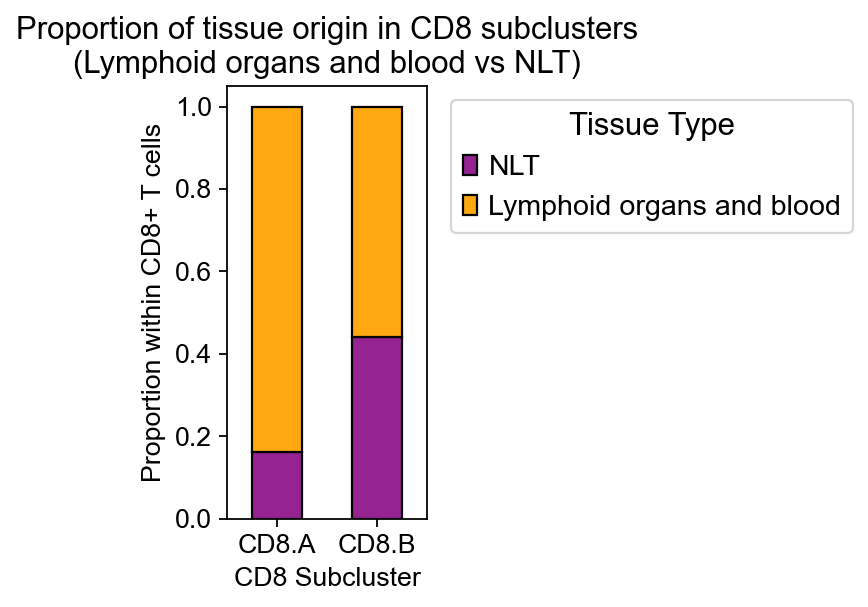

Plot saved: Fig_2f.pdf

Total cells used → CD8.A: 14,563 | CD8.B: 4,598

Final proportions:
         NLT  Lymphoid organs and blood
CD8.A  0.161                      0.839
CD8.B  0.442                      0.558


In [16]:
# Fig. 2f — NLT vs SLO proportions within CD8.A/B
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file
file_path = 'data/immgenT-CD8.xlsx'
df = pd.read_excel(file_path)

# ====================== TISSUE CLASSIFICATION ======================
def assign_tissue_category(row):
    if pd.notna(row['condition_detailed_organ']):
        organ = str(row['condition_detailed_organ']).lower()
        
        tumor_lns = ['lninguinal_b16_act', 'lninguinal_b16_actapd1a41bb', 
                     'lnmediastinal_kp', 'lninguinal_kp']
        if any(tumor_ln in organ for tumor_ln in tumor_lns):
            return 'Tumor'
        
        lymphoid_keywords = ['spleen', 'thymus', 'ln', 'bonemarrow', 'bone marrow', 'blood']
        if any(kw in organ for kw in lymphoid_keywords):
            return 'Lymphoid organs and blood'
    
    if pd.notna(row.get('condition_broad')) and ('tumor' in str(row['condition_broad']).lower() or 
                                                  'cancer' in str(row['condition_broad']).lower()):
        return 'Tumor'
    
    return 'NLT'


df['tissue_category'] = df.apply(assign_tissue_category, axis=1)

# ====================== FILTERS ======================
if 'target_cells' in df.columns:
    df = df[~df['target_cells'].str.contains('CD4\+ CD44\+', case=False, na=False)].copy()

unwanted = ['Treg', 'CD4+ T', 'DN', 'DO11.10 KJ1-26', 'OT2', 'TCRBV-TCRGD', 'TFH',
            'Vd6b F4.22', 'Vg4 49.2', 'Vg6 1C10', 'Vg7 F2.67', 'thymocytes']
mask = df['target_cells'].isin(unwanted) | df['target_cells'].str.contains('|'.join(unwanted), case=False, na=False)
df = df[~mask].copy()

exclude_conditions = ['KbDbKO', 'KbDbQa1KO', 'KbDbQa1KO_MCMV']
df = df[~df['condition_detailed_organ'].str.contains('|'.join(exclude_conditions), case=False, na=False)].copy()

if 'condition_detailed_simplified' in df.columns:
    df = df[df['condition_detailed_simplified'] != 'baseline'].copy()

# ====================== AGGREGATE REPLICATES ======================
group_cols = ['condition_detailed_organ', 'tissue_category']
agg_dict = {
    'CD8.A.prop': 'mean',
    'CD8.B.prop': 'mean',
    'CD8.A.ncells': 'mean',
    'CD8.B.ncells': 'mean'
}
if 'target_cells' in df.columns:
    agg_dict['target_cells'] = 'first'

df_agg = df.groupby(group_cols, as_index=False).agg(agg_dict)

# Quality filter
min_cells = 10
valid_mask = (df_agg['CD8.A.ncells'] >= min_cells) | (df_agg['CD8.B.ncells'] >= min_cells)
df_filtered = df_agg[valid_mask].copy()

df_filtered = df_filtered[df_filtered['tissue_category'] != 'Tumor'].copy()

print(f"Final number of unique conditions used: {df_filtered.shape[0]}")

# ====================== CALCULATE PROPORTIONS USING COUNTS ======================
lymph_A = df_filtered[df_filtered['tissue_category'] == 'Lymphoid organs and blood']['CD8.A.ncells'].sum()
nlt_A   = df_filtered[df_filtered['tissue_category'] == 'NLT']['CD8.A.ncells'].sum()
lymph_B = df_filtered[df_filtered['tissue_category'] == 'Lymphoid organs and blood']['CD8.B.ncells'].sum()
nlt_B   = df_filtered[df_filtered['tissue_category'] == 'NLT']['CD8.B.ncells'].sum()

total_A = lymph_A + nlt_A
total_B = lymph_B + nlt_B

summary = pd.DataFrame({
    'CD8.A': {
        'NLT': nlt_A / total_A,
        'Lymphoid organs and blood': lymph_A / total_A
        
    },
    'CD8.B': {
        'Lymphoid organs and blood': lymph_B / total_B,
        'NLT': nlt_B / total_B
    }
}).T

# ====================== PLOT ======================
fig, ax = plt.subplots(figsize=(5, 4))

summary.plot(
    kind='bar',
    stacked=True,
    ax=ax,
    color=['#952391', '#FFA811'],
    edgecolor='black'
)

ax.set_title('Proportion of tissue origin in CD8 subclusters\n(Lymphoid organs and blood vs NLT)', fontsize=14)
ax.set_xlabel('CD8 Subcluster', fontsize=12)
ax.set_ylabel('Proportion within CD8+ T cells', fontsize=12)

ax.legend(title='Tissue Type', bbox_to_anchor=(1.05, 1), loc='upper left')
ax.grid(False)
plt.xticks(rotation=0, ha='center', fontsize=12)
plt.yticks(fontsize=12)
plt.ylim(0, 1.05)
plt.tight_layout()

plt.savefig('Fig_2f.pdf', bbox_inches='tight')
plt.show()
plt.close()

print("Plot saved: Fig_2f.pdf")
print(f"\nTotal cells used → CD8.A: {total_A:,.0f} | CD8.B: {total_B:,.0f}")
print("\nFinal proportions:")
print(summary.round(3))


# Fig. 3

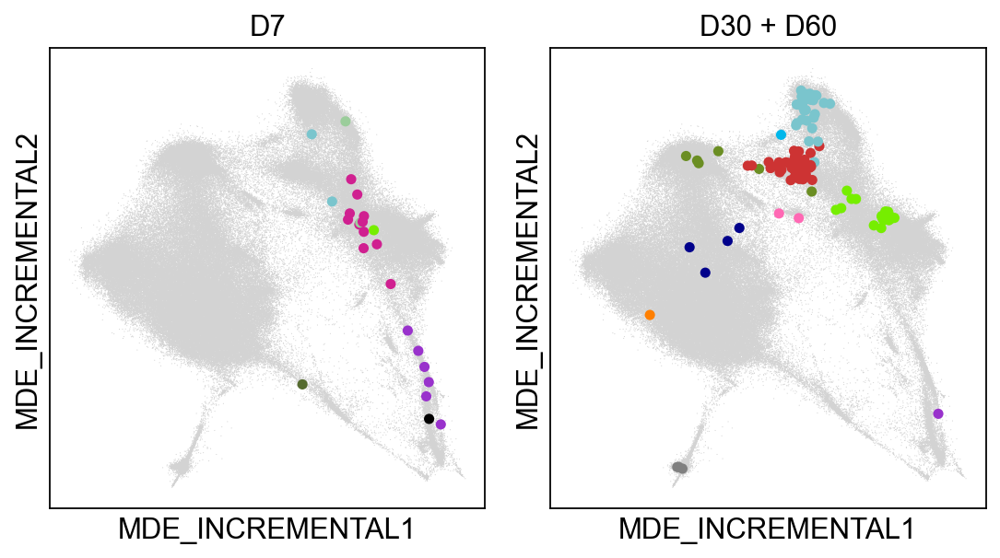

Combined plot saved: Fig_3a.pdf


In [18]:
# Fig. 3a — Effector memory clusters on MDE plot
# Memory clusters: early (D7) vs late (D30+D60) SLO embeddings
titles = ['D7', 'D30 + D60']

# Define the three organs to merge
organs = ['LNmediastinal', 'spleen', 'LNmesenteric']

# Gray background for non-highlighted cells
default_color = '#BAB0AC' # Gray for cells not meeting the condition

# Set up the figure with TWO subplots
fig, axes = plt.subplots(1, 2, figsize=(7, 4))

# Iterate over the two plots
for idx, (title, ax) in enumerate(zip(titles, axes)):
    
    if idx == 0:  # First plot: D7 only
        conditions = [f"{organ}_LCMVarm_D7" for organ in organs]
    else:         # Second plot: D30 + D60
        conditions = [f"{organ}_LCMVarm_D30" for organ in organs] + \
                     [f"{organ}_LCMVarm_D60" for organ in organs]
    
    # Create mask for the selected conditions
    mask = rna.obs['condition_detailed_organ'].isin(conditions)
    
    # Create a new column for coloring based on conditions
    rna.obs['highlight_color'] = np.where(
        mask & (rna.obs['Ag_spe_v2'].str.lower() == 'p14'),
        rna.obs['cluster_annotation'], # Use cluster_annotation for highlighted cells
        None # None for cells that don't meet the condition
    )
    
    # Set dot sizes: larger for highlighted cells
    sizes = np.where(rna.obs['highlight_color'].notnull(), 100, 1)
    
    # Plot MDE
    sc.pl.embedding(
        rna,
        basis="MDE_INCREMENTAL",
        color="highlight_color",
        palette=custom_colors,
        legend_loc=None, # No legend
        ax=ax,
        size=sizes,
        show=False,
        title=title # Use nice title
    )

# Adjust layout to prevent overlap
plt.tight_layout()

# Save and show the combined plot
plt.savefig("Fig_3a.pdf", bbox_inches="tight")
plt.show()
plt.close()
print("Combined plot saved: Fig_3a.pdf")


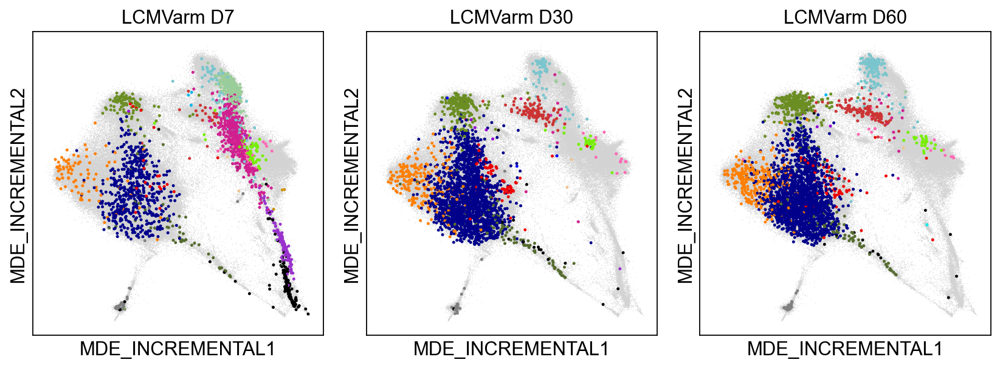

Combined plot saved: Fig_3a_v2.pdf


In [19]:
# Fig. 3a — Effector memory clusters on MDE plot
# SLO organs merged per time point (endogenous highlight)
timepoints = ['D7', 'D30', 'D60']

# Define the three conditions (organs) to merge for each time point
organs = ['LNmediastinal', 'spleen', 'LNmesenteric']

# Gray background for non-highlighted cells
default_color = '#BAB0AC'  # Gray for cells not meeting the condition

# Set up the figure with three subplots (one per time point)
fig, axes = plt.subplots(1, 3, figsize=(10.5, 4))

# Iterate over time points and corresponding axes
for idx, (tp, ax) in enumerate(zip(timepoints, axes)):
    
    # Create condition list for this time point
    conditions = [f"{organ}_LCMVarm_{tp}" for organ in organs]
    
    # Create a new column for coloring: highlight endogenous cells from ANY of the three organs at this time point
    rna.obs['highlight_color'] = np.where(
        (rna.obs['condition_detailed_organ'].isin(conditions)) & 
        (rna.obs['Ag_spe_v2'].str.lower() == 'endogenous'),
        rna.obs['cluster_annotation'],   # Use cluster_annotation for highlighted cells
        None                            # None for all other cells
    )
    
    # Set dot sizes: larger for highlighted cells
    sizes = np.where(rna.obs['highlight_color'].notnull(), 20, 1)
    
    # Plot MDE
    sc.pl.embedding(
        rna,
        basis="MDE_INCREMENTAL",
        color="highlight_color",
        palette=custom_colors,
        legend_loc=None,          # No legend
        ax=ax,
        size=sizes,
        show=False,
        title=f"LCMVarm {tp}"     # Title shows the time point
    )

# Adjust layout to prevent overlap
plt.tight_layout()

# Save and show the combined plot
plt.savefig("Fig_3a_v2.pdf", bbox_inches="tight")
plt.show()
plt.close()
print("Combined plot saved: Fig_3a_v2.pdf")

In [20]:
# Fig. 3f — Dot plot
import pandas as pd
import numpy as np

def select_top_genes(signature_file, clusters, pval_threshold=0.05, log2fc_threshold=0.5, highlight_gene_column='SYMBOL'):
    """
    Select the top 10 up-regulated and top 10 down-regulated genes for each cluster from a signature file.
    Parameters:
    - signature_file (str): Path to the signature file with DE results.
    - clusters (list): List of cluster names (e.g., ['CD8.E', 'CD8.F', ...]).
    - pval_threshold (float): Adjusted p-value threshold for significance.
    - log2fc_threshold (float): |log2FC| threshold for significance.
    - highlight_gene_column (str): Column name for genes in signature_file.
    Returns:
    - dict: Dictionary with cluster names as keys and tuples of (top_10_up, top_10_down) gene lists as values.
    """
    # Load the signature DataFrame
    signature_df = pd.read_csv(signature_file, sep='\t', encoding='utf-8')
    
    top_genes = {}
    for cluster in clusters:
        # Prepare data for the cluster
        log2fc_col = f'log2FC_{cluster}_vs_All'
        pval_col = f'adj.P.Val_{cluster}_vs_All'
        plot_df = signature_df[[highlight_gene_column, log2fc_col, pval_col]].copy()
        plot_df['gene'] = plot_df[highlight_gene_column]
        plot_df['log2FC'] = plot_df[log2fc_col]
        plot_df['minus_log10_padj'] = -np.log10(plot_df[pval_col].clip(lower=1e-300))
        
        # Highlight significant genes
        significant = plot_df[
            (plot_df[pval_col] < pval_threshold) & 
            (abs(plot_df['log2FC']) > log2fc_threshold)
        ]
        
        # Select top 10 up-regulated (highest positive log2FC)
        top_10_up = significant[significant['log2FC'] > 0][['gene', 'log2FC']].sort_values(
            'log2FC', ascending=False
        ).head(10)['gene'].tolist()
        
        # Select top 10 down-regulated (lowest negative log2FC)
        top_10_down = significant[significant['log2FC'] < 0][['gene', 'log2FC']].sort_values(
            'log2FC', ascending=True
        ).head(10)['gene'].tolist()
        
        top_genes[cluster] = (top_10_up, top_10_down)
    
    return top_genes

# Define file path and clusters
main_signature_file = 'data/ttlist_OneVsAll.txt'
clusters = ['CD8.I', 'CD8.J', 'CD8.K']

# Select top genes
top_genes_dict = select_top_genes(
    signature_file=main_signature_file,
    clusters=clusters,
    pval_threshold=0.05,
    log2fc_threshold=0.5,
    highlight_gene_column='SYMBOL'
)

# Print results
for cluster in clusters:
    up_genes, down_genes = top_genes_dict[cluster]
    print(f"Cluster {cluster}:")
    print(f"  Top 10 Up-regulated Genes: {up_genes}")
    print(f"  Top 10 Down-regulated Genes: {down_genes}")


Cluster CD8.I:
  Top 10 Up-regulated Genes: ['Ccl5', 'Gzma', 'Lgals1', 'Gzmb', 'Klrg1', 'S100a6', 'Nkg7', 'Cx3cr1', 'Zeb2', 'Ahnak']
  Top 10 Down-regulated Genes: ['Ly6e', 'Ltb', 'Tcf7', 'Il7r', 'Ccr7', 'Inpp4b', 'Emb', 'Mif', 'Rgs10', 'Ptma']
Cluster CD8.J:
  Top 10 Up-regulated Genes: ['S100a6', 'Lgals1', 'S100a10', 'Ccl5', 'Itgb1', 'Vim', 'Crip1', 'Lsp1', 'S100a11', 'Anxa2']
  Top 10 Down-regulated Genes: ['Bcl2', 'Ptma', 'Ccr7', 'Satb1', 'Lef1', 'Tubb5', 'Tuba1b']
Cluster CD8.K:
  Top 10 Up-regulated Genes: ['Hmgb2', 'Lgals1', 'Cenpa', 'Hmgn2', 'Ccnb2', 'S100a6', 'Anxa2', 'Vim', 'Birc5', 'Cks1b']
  Top 10 Down-regulated Genes: ['Ccr7', 'Malat1', 'Tcf7', 'Bcl2', 'Il7r', 'Sell', 'Btg1', 'Arhgap15', 'Bach2', 'Lef1']


Subset contains 15220 cells from 3 clusters
Final gene order (48 genes): 5 extra @ top ↑ | UP block | DOWN block ↓


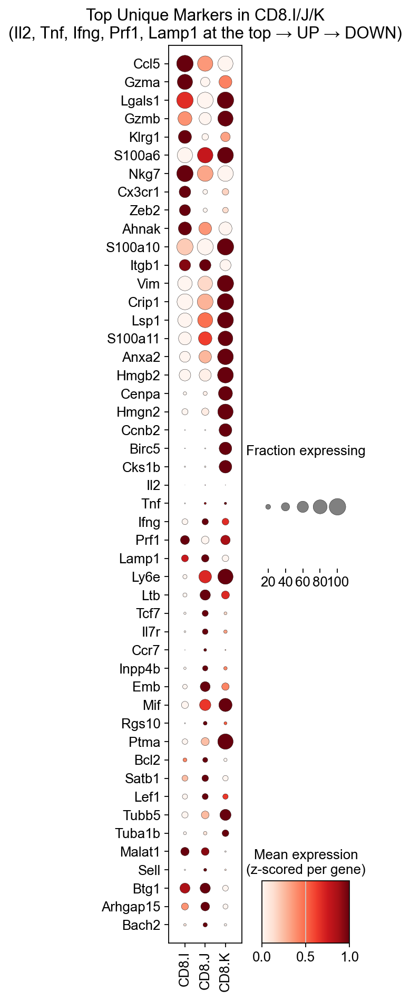

In [21]:
# Fig. 3f — Dot plot
import pandas as pd
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns

# ==============================================================
# 0. Clusters of interest
# ==============================================================
clusters_of_interest = ['CD8.I', 'CD8.J', 'CD8.K']

# ==============================================================
# 1. Subset AnnData to only these 3 clusters
# ==============================================================
adata = mdata['RNA']
subset_adata = adata[adata.obs['cluster_annotation'].isin(clusters_of_interest)]
print(f"Subset contains {subset_adata.n_obs} cells from {len(clusters_of_interest)} clusters")

# ==============================================================
# 2. Build ordered gene list
# ==============================================================
ordered_genes = []

# ---- BLOCK 0: All UP-regulated genes (CD8.I → CD8.J → CD8.K) ----
for cl in clusters_of_interest:
    for g in top_genes_dict[cl][0]:  # UP genes
        if g not in ordered_genes and g in subset_adata.var_names:
            ordered_genes.append(g)

# ---- BLOCK 1: Extra genes ----
extra_genes = ['Il2', 'Tnf', 'Ifng', 'Prf1', 'Lamp1']
for g in extra_genes:
    if g in subset_adata.var_names and g not in ordered_genes:
        ordered_genes.append(g)

# ---- BLOCK 2: All DOWN-regulated genes (CD8.I → CD8.J → CD8.K) ----
for cl in clusters_of_interest:
    for g in top_genes_dict[cl][1]:  # DOWN genes
        if g not in ordered_genes and g in subset_adata.var_names:
            ordered_genes.append(g)

# Warn about any missing genes
missing = [g for g in extra_genes + 
           [g for cl in clusters_of_interest for g in top_genes_dict[cl][0] + top_genes_dict[cl][1]] 
           if g not in subset_adata.var_names]
if missing:
    print(f"Warning: {len(missing)} requested genes not found in dataset: {missing}")

print(f"Final gene order ({len(ordered_genes)} genes): "
      f"{len(extra_genes)} extra @ top ↑ | UP block | DOWN block ↓")

# ==============================================================
# 3. Subset to these genes
# ==============================================================
adata_plot = subset_adata[:, ordered_genes].copy()

# Ensure correct category order for clusters
adata_plot.obs['cluster_annotation'] = adata_plot.obs['cluster_annotation'].astype('category')
adata_plot.obs['cluster_annotation'] = adata_plot.obs['cluster_annotation'].cat.reorder_categories(clusters_of_interest)

# ==============================================================
# 4. FINAL DOTPLOT — extra genes at the TOP, genes on y-axis
# ==============================================================
sc.pl.dotplot(
    adata_plot,
    var_names=ordered_genes,           # respects our custom order
    groupby='cluster_annotation',
    cmap='Reds',
    standard_scale='var',
    colorbar_title='Mean expression\n(z-scored per gene)',
    size_title='Fraction expressing',
    figsize=(2.75, 14),                   # tall figure for many genes
    title='Top Unique Markers in CD8.I/J/K\n'
          '(Il2, Tnf, Ifng, Prf1, Lamp1 at the top → UP → DOWN)',
    save='Fig_3f.pdf',
    dendrogram=False,
    swap_axes=True,                    # genes on y, clusters on x
    show=True
)


Loaded Excel file with 688 rows and 94 columns.
After target_cells filters: 634 rows remain.
After excluding KbDb conditions: 622 rows remain.
After excluding baseline: 365 rows remain.
After aggregating replicates: 181 unique conditions.
After ≥ 10 cells (averaged) in at least one cluster: 63 conditions remain.
Selected top 50 unique conditions by average combined proportion.


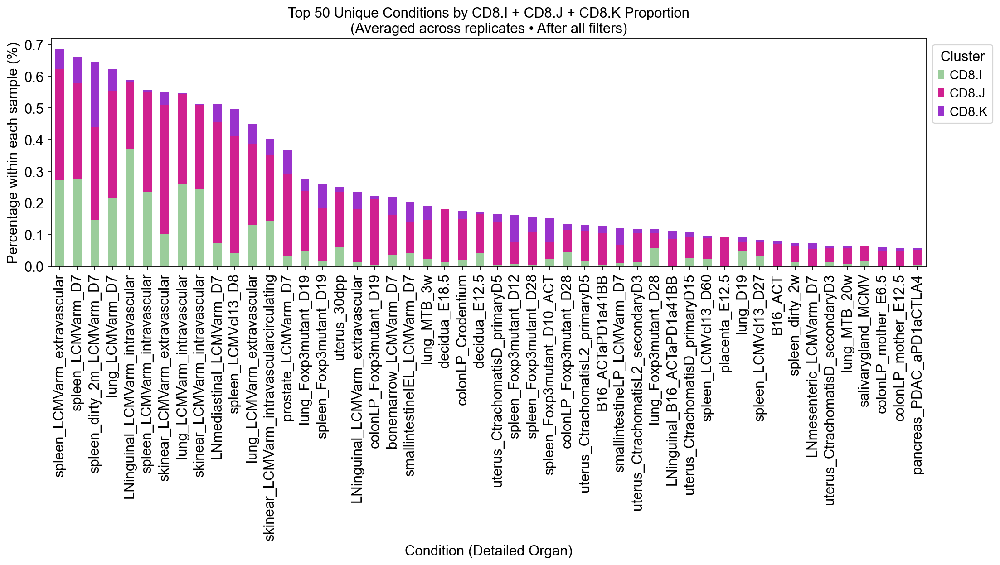

Stacked bar plot saved: Fig_3g.pdf

Top 10 unique conditions:
             condition_detailed_organ  total_prop  CD8.I.ncells  CD8.J.ncells  \
152      spleen_LCMVarm_extravascular    0.685590    125.000000    160.000000   
151                 spleen_LCMVarm_D7    0.662554    380.000000    418.000000   
162        spleen_dirty_2m_LCMVarm_D7    0.646279    207.666667    420.333333   
73                    lung_LCMVarm_D7    0.624092    509.000000    788.000000   
11   LNinguinal_LCMVarm_intravascular    0.587678     78.000000     45.000000   
153      spleen_LCMVarm_intravascular    0.556901    195.000000    261.000000   
104     skinear_LCMVarm_extravascular    0.551020      5.000000     20.000000   
75         lung_LCMVarm_intravascular    0.548209    189.000000    206.000000   
105     skinear_LCMVarm_intravascular    0.513514     54.000000     59.000000   
20           LNmediastinal_LCMVarm_D7    0.511561     25.000000    133.000000   

     CD8.K.ncells  CD8.I.prop  CD8.J.prop  CD8

In [22]:
# Fig. 3g — Effector cluster frequency across samples
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file
file_path = 'data/immgenT-CD8.xlsx'
df = pd.read_excel(file_path)

print(f"Loaded Excel file with {df.shape[0]} rows and {df.shape[1]} columns.")

# Define columns
prop_cols = ['CD8.I.prop', 'CD8.J.prop', 'CD8.K.prop']
ncells_cols = ['CD8.I.ncells', 'CD8.J.ncells', 'CD8.K.ncells']

# === FILTERS (applied on original rows before averaging) ===
if 'target_cells' in df.columns:
    df = df[~df['target_cells'].str.contains('CD4\+ CD44\+', case=False, na=False)].copy()
    unwanted = ['Treg', 'CD4+ T', 'DN', 'DO11.10 KJ1-26', 'OT2', 'TCRBV-TCRGD', 'TFH',
                'Vd6b F4.22', 'Vg4 49.2', 'Vg6 1C10', 'Vg7 F2.67', 'thymocytes']
    mask = df['target_cells'].isin(unwanted) | df['target_cells'].str.contains('|'.join(unwanted), case=False, na=False)
    df = df[~mask].copy()
    print(f"After target_cells filters: {df.shape[0]} rows remain.")

# Exclude KO conditions
exclude_conditions = ['KbDbKO', 'KbDbQa1KO', 'KbDbQa1KO_MCMV']
exclude_mask = df['condition_detailed_organ'].str.contains('|'.join(exclude_conditions), case=False, na=False)
df = df[~exclude_mask].copy()
print(f"After excluding KbDb conditions: {df.shape[0]} rows remain.")

# Exclude baseline
if 'condition_detailed_simplified' in df.columns:
    df = df[df['condition_detailed_simplified'] != 'baseline'].copy()
    print(f"After excluding baseline: {df.shape[0]} rows remain.")

# === AGGREGATE REPLICATES (Group by condition_detailed_organ) ===
group_cols = ['condition_detailed_organ']

agg_dict = {col: 'mean' for col in prop_cols + ncells_cols}
if 'target_cells' in df.columns:
    agg_dict['target_cells'] = 'first'   # keep one value for reference

df_agg = df.groupby(group_cols, as_index=False).agg(agg_dict)

print(f"After aggregating replicates: {df_agg.shape[0]} unique conditions.")

# === FILTER on averaged ncells: ≥10 in at least one cluster ===
min_cells = 10
valid_mask = (df_agg['CD8.I.ncells'] >= min_cells) | \
             (df_agg['CD8.J.ncells'] >= min_cells) | \
             (df_agg['CD8.K.ncells'] >= min_cells)

df_filtered = df_agg[valid_mask].copy()
print(f"After ≥ {min_cells} cells (averaged) in at least one cluster: {df_filtered.shape[0]} conditions remain.")

# Calculate total proportion for ranking
df_filtered['total_prop'] = df_filtered[prop_cols].sum(axis=1)
df_filtered = df_filtered[df_filtered['total_prop'] > 0].copy()

# Select top 50 unique conditions
df_top50 = df_filtered.nlargest(50, 'total_prop')

print(f"Selected top 50 unique conditions by average combined proportion.")

# Prepare for plotting
freq_table = df_top50[prop_cols].copy()
freq_table.index = df_top50['condition_detailed_organ']
freq_table.columns = ['CD8.I', 'CD8.J', 'CD8.K']

# Plot using your pre-existing custom_colors
fig, ax = plt.subplots(figsize=(14, 8))
freq_table.plot(kind='bar', stacked=True, ax=ax, 
                color=[custom_colors[col] for col in freq_table.columns])

ax.set_xlabel('Condition (Detailed Organ)')
ax.set_ylabel('Percentage within each sample (%)')
ax.set_title('Top 50 Unique Conditions by CD8.I + CD8.J + CD8.K Proportion\n(Averaged across replicates • After all filters)')
ax.grid(False)
ax.legend(title='Cluster', bbox_to_anchor=(1, 1), loc='upper left')

plt.xticks(rotation=90, ha='center')
plt.tight_layout()

# Save
plt.savefig('Fig_3g.pdf', bbox_inches='tight')
plt.show()
plt.close()

print("Stacked bar plot saved: Fig_3g.pdf")

# Preview
print("\nTop 10 unique conditions:")
print(df_top50[['condition_detailed_organ', 'total_prop'] + ncells_cols + prop_cols].head(10))


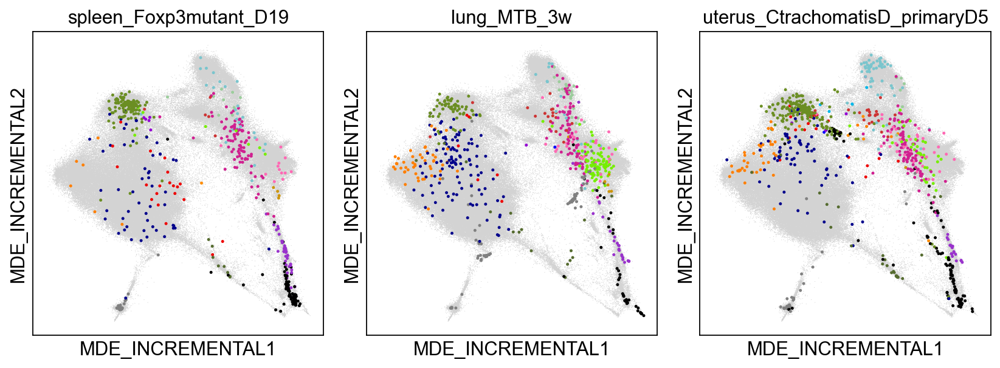

Combined plot saved: Fig_3h.pdf


In [23]:
# Fig. 3h — Representative condition MDEs
conditions = ['spleen_Foxp3mutant_D19', 'lung_MTB_3w', 'uterus_CtrachomatisD_primaryD5']

# Gray background for non-highlighted cells
default_color = '#BAB0AC'  # Gray for cells not meeting the condition

# Three-panel layout
fig, axes = plt.subplots(1, 3, figsize=(10.5, 4))  # 3 subplots horizontally, adjusted size

# Iterate over conditions and corresponding axes
for idx, (condition, ax) in enumerate(zip(conditions, axes)):
    # Create a new column for coloring based on conditions
    rna.obs['highlight_color'] = np.where(
        rna.obs['condition_detailed_organ'] == condition,
        rna.obs['cluster_annotation'],  # Use cluster_annotation for highlighted cells
        None  # None for cells that don't meet the condition
    )
    
    # Set dot sizes: larger for highlighted cells
    sizes = np.where(rna.obs['highlight_color'].notnull(), 20, 1)
    
    # Plot MDE
    sc.pl.embedding(
        rna,
        basis="MDE_INCREMENTAL",
        color="highlight_color",
        palette=custom_colors,
        legend_loc=None,  # No legend
        ax=ax,
        size=sizes,
        show=False,
        title=condition  # Add condition as subplot title
    )

# Adjust layout to prevent overlap
plt.tight_layout()

# Save and show the combined plot
plt.savefig("Fig_3h.pdf", bbox_inches="tight")
plt.show()
plt.close()
print("Combined plot saved: Fig_3h.pdf")
